# Importing libraries and data

In [1]:
#basic libraries
import pandas as pd
import numpy as np
import math

#visualisation
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
import missingno as msno
from plotly.figure_factory import create_scatterplotmatrix
from wordcloud import WordCloud
sns.set()

# Ignore warnings :
import warnings
warnings.filterwarnings('ignore')



In [2]:
#basic category description files
cats = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Product_Categories.csv")
subcats = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Product_Subcategories.csv")

In [3]:
cats.head()

,ProductCategoryKey,CategoryName
0,1,Bikes
1,2,Components
2,3,Clothing
3,4,Accessories


In [4]:
subcats.head()

,ProductSubcategoryKey,SubcategoryName,ProductCategoryKey
0,1,Mountain Bikes,1
1,2,Road Bikes,1
2,3,Touring Bikes,1
3,4,Handlebars,2
4,5,Bottom Brackets,2


In [5]:
# will need to merge together

In [6]:
#products
products = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Products.csv")

In [7]:
products.head()

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice
0,214,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900
1,215,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442
2,218,23,SO-B909-M,"Mountain Bike Socks, M",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,M,U,3.3963,9.5000
3,219,23,SO-B909-L,"Mountain Bike Socks, L",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,L,U,3.3963,9.5000
4,220,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442


In [8]:
#territories
loc = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Territories.csv")

In [9]:
loc.head()

,SalesTerritoryKey,Region,Country,Continent
0,1,Northwest,United States,North America
1,2,Northeast,United States,North America
2,3,Central,United States,North America
3,4,Southwest,United States,North America
4,5,Southeast,United States,North America


In [10]:
#sales files
sales2015 = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Sales_2015.csv")
sales2016 = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Sales_2016.csv")
sales2017 = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorks_Sales_2017.csv")

In [11]:
sales2015.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
0,1/1/2015,9/21/2001,SO45080,332,14657,1,1,1
1,1/1/2015,12/5/2001,SO45079,312,29255,4,1,1
2,1/1/2015,10/29/2001,SO45082,350,11455,9,1,1
3,1/1/2015,11/16/2001,SO45081,338,26782,6,1,1
4,1/2/2015,12/15/2001,SO45083,312,14947,10,1,1


In [12]:
sales2016.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
0,1/1/2016,10/17/2002,SO48797,385,14335,1,1,1
1,1/1/2016,9/30/2002,SO48802,383,24923,9,1,1
2,1/1/2016,11/29/2002,SO48801,326,15493,1,1,1
3,1/1/2016,11/16/2002,SO48799,352,26708,4,1,1
4,1/1/2016,12/16/2002,SO48798,369,23332,9,1,1


In [13]:
sales2017.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
0,1/1/2017,12/13/2003,SO61285,529,23791,1,2,2
1,1/1/2017,9/24/2003,SO61285,214,23791,1,3,1
2,1/1/2017,9/4/2003,SO61285,540,23791,1,1,1
3,1/1/2017,9/28/2003,SO61301,529,16747,1,2,2
4,1/1/2017,10/21/2003,SO61301,377,16747,1,1,1


In [14]:
sales2015.OrderLineItem.value_counts()

1    2630
Name: OrderLineItem, dtype: int64

In [15]:
sales2017.OrderLineItem.value_counts()

1    11839
2     9626
3     5272
4     2201
5      467
6       66
7        8
8        2
Name: OrderLineItem, dtype: int64

In [16]:
# need to concat the 3 years together

In [17]:
# customers
cust1 = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdventureWorksCustomers.csv", encoding="ISO-8859-1")
cust2 = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AdvWorksCusts.csv")


In [18]:
cust1.head()

,CustomerKey,Prefix,FirstName,LastName,BirthDate,MaritalStatus,Gender,EmailAddress,AnnualIncome,TotalChildren,EducationLevel,Occupation,HomeOwner
0,11000,MR.,JON,YANG,04-08-1966,M,M,jon24@adventure-works.com,"$90,000",2,Bachelors,Professional,Y
1,11001,MR.,EUGENE,HUANG,5/14/1965,S,M,eugene10@adventure-works.com,"$60,000",3,Bachelors,Professional,N
2,11002,MR.,RUBEN,TORRES,08-12-1965,M,M,ruben35@adventure-works.com,"$60,000",3,Bachelors,Professional,Y
3,11003,MS.,CHRISTY,ZHU,2/15/1968,S,F,christy12@adventure-works.com,"$70,000",0,Bachelors,Professional,N
4,11004,MRS.,ELIZABETH,JOHNSON,08-08-1968,S,F,elizabeth5@adventure-works.com,"$80,000",5,Bachelors,Professional,Y


In [19]:
cust2.head()

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,11000,NaN,Jon,V,Yang,NaN,3761 N. 14th St,NaN,Rockhampton,Queensland,...,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947
1,11001,NaN,Eugene,L,Huang,NaN,2243 W St.,NaN,Seaford,Victoria,...,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141
2,11002,NaN,Ruben,NaN,Torres,NaN,5844 Linden Land,NaN,Hobart,Tasmania,...,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945
3,11003,NaN,Christy,NaN,Zhu,NaN,1825 Village Pl.,NaN,North Ryde,New South Wales,...,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688
4,11004,NaN,Elizabeth,NaN,Johnson,NaN,7553 Harness Circle,NaN,Wollongong,New South Wales,...,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771


In [20]:
cust1.columns

Index(['CustomerKey', 'Prefix', 'FirstName', 'LastName', 'BirthDate',
       'MaritalStatus', 'Gender', 'EmailAddress', 'AnnualIncome',
       'TotalChildren', 'EducationLevel', 'Occupation', 'HomeOwner'],
      dtype='object')

In [21]:
cust2.columns

Index(['CustomerID', 'Title', 'FirstName', 'MiddleName', 'LastName', 'Suffix',
       'AddressLine1', 'AddressLine2', 'City', 'StateProvinceName',
       'CountryRegionName', 'PostalCode', 'PhoneNumber', 'BirthDate',
       'Education', 'Occupation', 'Gender', 'MaritalStatus', 'HomeOwnerFlag',
       'NumberCarsOwned', 'NumberChildrenAtHome', 'TotalChildren',
       'YearlyIncome'],
      dtype='object')

In [22]:
cust = cust2.copy()

In [23]:
# checking if we have the same customer keys
cust[cust.CustomerID == 23791]

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
11423,23791,NaN,Aaron,NaN,Griffin,NaN,828 Pinewood Court,NaN,Walla Walla,Washington,...,1955-10-14,Partial High School,Clerical,M,S,0,2,0,3,19597


In [24]:
cust1[cust1.CustomerKey == 23791]

,CustomerKey,Prefix,FirstName,LastName,BirthDate,MaritalStatus,Gender,EmailAddress,AnnualIncome,TotalChildren,EducationLevel,Occupation,HomeOwner
12547,23791,MR.,AARON,GRIFFIN,10/14/1955,S,M,aaron20@adventure-works.com,"$20,000",3,Partial High School,Clerical,N


In [25]:
# customer purchase flags that could be used for tests, or maybe safer to calculate from orders
spend = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AW_AveMonthSpend.csv")
buyer = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AW_BikeBuyer.csv")

In [26]:
spend.head()

,CustomerID,AveMonthSpend
0,11000,89
1,11001,117
2,11002,123
3,11003,50
4,11004,95


In [27]:
buyer.head()

,CustomerID,BikeBuyer
0,11000,0
1,11001,1
2,11002,0
3,11003,0
4,11004,1


In [28]:
test = pd.read_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/datasets/AW_test.csv")

In [29]:
test.head()

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,18988,NaN,Courtney,A,Baker,NaN,8727 Buena Vista Ave.,NaN,Fremont,California,...,1/5/1945,Bachelors,Management,F,S,0,2,0,5,86931
1,29135,NaN,Adam,C,Allen,NaN,3491 Cook Street,NaN,Haney,British Columbia,...,10/4/1964,Bachelors,Skilled Manual,M,M,1,2,2,4,100125
2,12156,NaN,Bonnie,NaN,Raji,NaN,359 Pleasant Hill Rd,NaN,Burbank,California,...,1/12/1934,Graduate Degree,Management,F,M,1,2,0,4,103985
3,13749,NaN,Julio,C,Alonso,NaN,8945 Euclid Ave.,NaN,Burlingame,California,...,9/22/1958,Graduate Degree,Skilled Manual,M,M,1,0,0,4,127161
4,27780,NaN,Christy,A,Andersen,NaN,"42, boulevard Tremblay",NaN,Dunkerque,Nord,...,3/19/1965,High School,Manual,F,M,1,1,2,2,21876


In [30]:
# checking if we have a way to check if our test answers are correct
sales2015[sales2015.CustomerKey == 18988]

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity


In [31]:
sales2016[sales2016.CustomerKey == 18988]

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity


In [32]:
sales2017[sales2017.CustomerKey == 18988]

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
19237,5/4/2017,2/23/2004,SO69814,474,18988,4,1,1


In [33]:
spend[spend.CustomerID == 18988]

,CustomerID,AveMonthSpend


In [34]:
buyer[buyer.CustomerID == 18988]

,CustomerID,BikeBuyer


In [35]:
# checking if these are already on the other customer dataset
cust[cust.CustomerID == 18988]

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome


In [36]:
cust[cust.CustomerID == 29135]

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome


In [37]:
cust[cust.CustomerID == 27780]

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome


In [38]:
# these customers have purchased but are not on our original dataset, so can be used for testing our models
# before building any models, need to drop their orders from the sales in order for the test to work

# Initial data cleaning

In [39]:
# cats
cats.isnull().sum()

ProductCategoryKey    0
CategoryName          0
dtype: int64

In [40]:
cats.duplicated().sum()

0

In [41]:
#subcats
subcats.isnull().sum()

ProductSubcategoryKey    0
SubcategoryName          0
ProductCategoryKey       0
dtype: int64

In [42]:
subcats.duplicated().sum()

0

In [43]:
#products
products.isnull().sum()

ProductKey                0
ProductSubcategoryKey     0
ProductSKU                0
ProductName               0
ModelName                 0
ProductDescription        0
ProductColor             50
ProductSize               0
ProductStyle              0
ProductCost               0
ProductPrice              0
dtype: int64

In [44]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 293 entries, 0 to 292
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ProductKey             293 non-null    int64  
 1   ProductSubcategoryKey  293 non-null    int64  
 2   ProductSKU             293 non-null    object 
 3   ProductName            293 non-null    object 
 4   ModelName              293 non-null    object 
 5   ProductDescription     293 non-null    object 
 6   ProductColor           243 non-null    object 
 7   ProductSize            293 non-null    object 
 8   ProductStyle           293 non-null    object 
 9   ProductCost            293 non-null    float64
 10  ProductPrice           293 non-null    float64
dtypes: float64(2), int64(2), object(7)
memory usage: 25.3+ KB


In [45]:
# dropping 50 is a lot when we only have 293 products

In [46]:
products.ProductColor.value_counts(normalize=True)

Black           0.362140
Red             0.152263
Silver          0.148148
Yellow          0.148148
Blue            0.106996
Multi           0.032922
Silver/Black    0.028807
White           0.016461
Grey            0.004115
Name: ProductColor, dtype: float64

In [47]:
products[products.ProductColor.isnull()]

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice
95,391,10,FK-1639,LL Fork,LL Fork,Stout design absorbs shock and offers more pre...,NaN,0,0,65.8097,148.2200
96,392,10,FK-5136,ML Fork,ML Fork,Composite road fork with an aluminum steerer t...,NaN,0,0,77.9176,175.4900
97,393,10,FK-9939,HL Fork,HL Fork,High-performance carbon road fork with curved ...,NaN,0,0,101.8936,229.4900
98,394,11,HS-0296,LL Headset,LL Headset,Threadless headset provides quality at an econ...,NaN,0,0,15.1848,34.2000
99,395,11,HS-2451,ML Headset,ML Headset,Sealed cartridge keeps dirt out.,NaN,0,0,45.4168,102.2900
100,396,11,HS-3479,HL Headset,HL Headset,"High-quality 1"" threadless headset with a grea...",NaN,0,0,55.3801,124.7300
101,397,4,HB-M243,LL Mountain Handlebars,LL Mountain Handlebars,All-purpose bar for on or off-road.,NaN,0,0,17.9780,40.4909
102,399,4,HB-M763,ML Mountain Handlebars,ML Mountain Handlebars,Tough aluminum alloy bars for downhill.,NaN,0,0,24.9932,56.2909
103,401,4,HB-M918,HL Mountain Handlebars,HL Mountain Handlebars,Flat bar strong enough for the pro circuit.,NaN,0,0,48.5453,109.3364
104,403,4,HB-R504,LL Road Handlebars,LL Road Handlebars,Unique shape provides easier reach to the levers.,NaN,0,0,17.9780,40.4909


In [48]:
# will leave for now, colour is probably not very useful a variable anyway

In [49]:
products.duplicated().sum()

0

In [50]:
#loc
loc.isnull().sum()

SalesTerritoryKey    0
Region               0
Country              0
Continent            0
dtype: int64

In [51]:
loc.duplicated().sum()

0

In [52]:
#sales
sales2015.isnull().sum()

OrderDate        0
StockDate        0
OrderNumber      0
ProductKey       0
CustomerKey      0
TerritoryKey     0
OrderLineItem    0
OrderQuantity    0
dtype: int64

In [53]:
sales2015.duplicated().sum()

0

In [54]:
sales2016.isnull().sum()

OrderDate        0
StockDate        0
OrderNumber      0
ProductKey       0
CustomerKey      0
TerritoryKey     0
OrderLineItem    0
OrderQuantity    0
dtype: int64

In [55]:
sales2017.isnull().sum()

OrderDate        0
StockDate        0
OrderNumber      0
ProductKey       0
CustomerKey      0
TerritoryKey     0
OrderLineItem    0
OrderQuantity    0
dtype: int64

In [56]:
sales2016.duplicated().sum()

0

In [57]:
sales2017.duplicated().sum()

0

In [58]:
# cust
cust.isnull().sum()

CustomerID                  0
Title                   16431
FirstName                   0
MiddleName               6985
LastName                    0
Suffix                  16517
AddressLine1                0
AddressLine2            16243
City                        0
StateProvinceName           0
CountryRegionName           0
PostalCode                  0
PhoneNumber                 0
BirthDate                   0
Education                   0
Occupation                  0
Gender                      0
MaritalStatus               0
HomeOwnerFlag               0
NumberCarsOwned             0
NumberChildrenAtHome        0
TotalChildren               0
YearlyIncome                0
dtype: int64

In [59]:
cust.head()

,CustomerID,Title,FirstName,MiddleName,LastName,Suffix,AddressLine1,AddressLine2,City,StateProvinceName,...,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,11000,NaN,Jon,V,Yang,NaN,3761 N. 14th St,NaN,Rockhampton,Queensland,...,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947
1,11001,NaN,Eugene,L,Huang,NaN,2243 W St.,NaN,Seaford,Victoria,...,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141
2,11002,NaN,Ruben,NaN,Torres,NaN,5844 Linden Land,NaN,Hobart,Tasmania,...,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945
3,11003,NaN,Christy,NaN,Zhu,NaN,1825 Village Pl.,NaN,North Ryde,New South Wales,...,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688
4,11004,NaN,Elizabeth,NaN,Johnson,NaN,7553 Harness Circle,NaN,Wollongong,New South Wales,...,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771


In [60]:
#will drop the columns with a lot of NAs
custraw = cust.copy()
cust.drop(["Title", "MiddleName", "Suffix", "AddressLine2"], axis=1, inplace=True)

In [61]:
cust.isnull().sum()

CustomerID              0
FirstName               0
LastName                0
AddressLine1            0
City                    0
StateProvinceName       0
CountryRegionName       0
PostalCode              0
PhoneNumber             0
BirthDate               0
Education               0
Occupation              0
Gender                  0
MaritalStatus           0
HomeOwnerFlag           0
NumberCarsOwned         0
NumberChildrenAtHome    0
TotalChildren           0
YearlyIncome            0
dtype: int64

In [62]:
cust.duplicated().sum()

98

In [63]:
custraw.duplicated().sum()

98

In [64]:
cust[cust.duplicated()]

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
2420,11430,Casey,Yuan,Hunzinger Allee 153,Bottrop,Nordrhein-Westfalen,Germany,46236,1 (11) 500 555-0184,1952-03-24,High School,Professional,F,M,1,2,1,4,99356
2421,13701,Haley,Scott,2905 Limeridge Drive,Newton,British Columbia,Canada,V2M1N7,384-555-0163,1974-11-23,Partial College,Clerical,F,S,1,1,3,3,46333
2509,11285,Jeremy,Anderson,7655 Greer Ave,Fremont,California,United States,94536,940-555-0176,1962-03-19,Partial College,Professional,M,M,0,4,3,3,164943
2976,11748,Blake,Hill,1315 Norse Drive,Victoria,British Columbia,Canada,V8V,171-555-0174,1958-07-18,Graduate Degree,Professional,M,M,1,1,4,5,121938
3168,14532,Barbara,Wu,"818, rue de Berri",Courbevoie,Hauts de Seine,France,92400,1 (11) 500 555-0150,1962-11-21,Graduate Degree,Clerical,F,M,1,0,0,1,31886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16514,13121,Latasha,Jimenez,7259 Birchwood,Melton,Victoria,Australia,3337,1 (11) 500 555-0118,1965-03-22,Bachelors,Professional,F,M,1,4,5,5,101542
16515,26100,James,Ptaszynski,7345 Kenwal Rd.,Shawnee,British Columbia,Canada,V8Z 4N5,127-555-0194,1936-04-02,Partial College,Professional,F,S,1,2,0,3,46549
16516,11328,Julian,Griffin,7398 Withersed Lane,Newton,British Columbia,Canada,V2L3W8,636-555-0197,1940-01-01,Bachelors,Management,M,M,1,2,0,5,133053
16517,23077,Marvin,Hernandez,1019 Book Road,Rhodes,New South Wales,Australia,2138,1 (11) 500 555-0112,1946-10-20,High School,Skilled Manual,M,M,1,2,0,4,31930


In [65]:
cust[cust.CustomerID == 11430]

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
390,11430,Casey,Yuan,Hunzinger Allee 153,Bottrop,Nordrhein-Westfalen,Germany,46236,1 (11) 500 555-0184,1952-03-24,High School,Professional,F,M,1,2,1,4,99356
2420,11430,Casey,Yuan,Hunzinger Allee 153,Bottrop,Nordrhein-Westfalen,Germany,46236,1 (11) 500 555-0184,1952-03-24,High School,Professional,F,M,1,2,1,4,99356


In [66]:
cust.drop_duplicates(inplace=True)

In [67]:
cust.duplicated().sum()

0

In [68]:
#spend
spend.isnull().sum()

CustomerID       0
AveMonthSpend    0
dtype: int64

In [69]:
spend.duplicated().sum()

98

In [70]:
spend[spend.CustomerID == 11430]

,CustomerID,AveMonthSpend
390,11430,70
2420,11430,70


In [71]:
spendraw = spend.copy()
spend.drop_duplicates(inplace=True)

In [72]:
spend.duplicated().sum()

0

In [73]:
#buyer
buyer.isnull().sum()

CustomerID    0
BikeBuyer     0
dtype: int64

In [74]:
buyer.duplicated().sum()

111

In [75]:
buyer[buyer.CustomerID == 11430]

,CustomerID,BikeBuyer
390,11430,0
2420,11430,0


In [76]:
buyerraw = buyer.copy()
buyer.drop_duplicates(inplace=True)

In [77]:
buyer.duplicated().sum()

0

In [78]:
cust.shape

(16421, 19)

In [79]:
spend.shape

(16421, 2)

In [80]:
buyer.shape # possibly problematic, just re calculate to be sure


(16408, 2)

In [81]:
#test
test.isnull().sum()

CustomerID                0
Title                   496
FirstName                 0
MiddleName              216
LastName                  0
Suffix                  499
AddressLine1              0
AddressLine2            487
City                      0
StateProvinceName         0
CountryRegionName         0
PostalCode                0
PhoneNumber               0
BirthDate                 0
Education                 0
Occupation                0
Gender                    0
MaritalStatus             0
HomeOwnerFlag             0
NumberCarsOwned           0
NumberChildrenAtHome      0
TotalChildren             0
YearlyIncome              0
dtype: int64

In [82]:
#will drop the same columns as cust
testraw = test.copy()
test.drop(["Title", "MiddleName", "Suffix", "AddressLine2"], axis=1, inplace=True)

In [83]:
test.isnull().sum()

CustomerID              0
FirstName               0
LastName                0
AddressLine1            0
City                    0
StateProvinceName       0
CountryRegionName       0
PostalCode              0
PhoneNumber             0
BirthDate               0
Education               0
Occupation              0
Gender                  0
MaritalStatus           0
HomeOwnerFlag           0
NumberCarsOwned         0
NumberChildrenAtHome    0
TotalChildren           0
YearlyIncome            0
dtype: int64

In [84]:
cust.shape

(16421, 19)

In [85]:
test.shape

(500, 19)

In [86]:
test.duplicated().sum()

0

# general view of datasets

In [87]:
#cats
cats.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ProductCategoryKey  4 non-null      int64 
 1   CategoryName        4 non-null      object
dtypes: int64(1), object(1)
memory usage: 192.0+ bytes


In [88]:
#subcats
subcats.info() # add cat description

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37 entries, 0 to 36
Data columns (total 3 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   ProductSubcategoryKey  37 non-null     int64 
 1   SubcategoryName        37 non-null     object
 2   ProductCategoryKey     37 non-null     int64 
dtypes: int64(2), object(1)
memory usage: 1016.0+ bytes


In [89]:
#products
products.info() # add cat and subcat desc

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 293 entries, 0 to 292
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ProductKey             293 non-null    int64  
 1   ProductSubcategoryKey  293 non-null    int64  
 2   ProductSKU             293 non-null    object 
 3   ProductName            293 non-null    object 
 4   ModelName              293 non-null    object 
 5   ProductDescription     293 non-null    object 
 6   ProductColor           243 non-null    object 
 7   ProductSize            293 non-null    object 
 8   ProductStyle           293 non-null    object 
 9   ProductCost            293 non-null    float64
 10  ProductPrice           293 non-null    float64
dtypes: float64(2), int64(2), object(7)
memory usage: 25.3+ KB


In [90]:
#loc
loc.info() # add the territory desc to cust and sales to build maps

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10 entries, 0 to 9
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   SalesTerritoryKey  10 non-null     int64 
 1   Region             10 non-null     object
 2   Country            10 non-null     object
 3   Continent          10 non-null     object
dtypes: int64(1), object(3)
memory usage: 448.0+ bytes


In [91]:
#sales
sales2015.info() 
# merge all sales years together
# add cats and subcats and territory desc
# maybe move cust details here?

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2630 entries, 0 to 2629
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   OrderDate      2630 non-null   object
 1   StockDate      2630 non-null   object
 2   OrderNumber    2630 non-null   object
 3   ProductKey     2630 non-null   int64 
 4   CustomerKey    2630 non-null   int64 
 5   TerritoryKey   2630 non-null   int64 
 6   OrderLineItem  2630 non-null   int64 
 7   OrderQuantity  2630 non-null   int64 
dtypes: int64(5), object(3)
memory usage: 164.5+ KB


In [92]:
#cust
cust.info()
# need to get their purchase data: first and last purchase, total spent, avg spent and maybe spend by category

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16421 entries, 0 to 16507
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   CustomerID            16421 non-null  int64 
 1   FirstName             16421 non-null  object
 2   LastName              16421 non-null  object
 3   AddressLine1          16421 non-null  object
 4   City                  16421 non-null  object
 5   StateProvinceName     16421 non-null  object
 6   CountryRegionName     16421 non-null  object
 7   PostalCode            16421 non-null  object
 8   PhoneNumber           16421 non-null  object
 9   BirthDate             16421 non-null  object
 10  Education             16421 non-null  object
 11  Occupation            16421 non-null  object
 12  Gender                16421 non-null  object
 13  MaritalStatus         16421 non-null  object
 14  HomeOwnerFlag         16421 non-null  int64 
 15  NumberCarsOwned       16421 non-null

In [93]:
#test
test.info() # need to merge with cust and then take out 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   CustomerID            500 non-null    int64 
 1   FirstName             500 non-null    object
 2   LastName              500 non-null    object
 3   AddressLine1          500 non-null    object
 4   City                  500 non-null    object
 5   StateProvinceName     500 non-null    object
 6   CountryRegionName     500 non-null    object
 7   PostalCode            500 non-null    object
 8   PhoneNumber           500 non-null    object
 9   BirthDate             500 non-null    object
 10  Education             500 non-null    object
 11  Occupation            500 non-null    object
 12  Gender                500 non-null    object
 13  MaritalStatus         500 non-null    object
 14  HomeOwnerFlag         500 non-null    int64 
 15  NumberCarsOwned       500 non-null    in

# Merging the datasets

## all sales

In [94]:
sales1516 = pd.concat([sales2015, sales2016], axis=0)

In [95]:
sales2015.shape

(2630, 8)

In [96]:
sales2016.shape

(23935, 8)

In [97]:
sales1516.shape

(26565, 8)

In [98]:
2630+23935

26565

In [99]:
sales = pd.concat([sales1516, sales2017], axis=0)

In [100]:
sales2017.shape

(29481, 8)

In [101]:
26565+29481

56046

In [102]:
sales.shape

(56046, 8)

In [103]:
sales.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/allsales.csv")

In [104]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56046 entries, 0 to 29480
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   OrderDate      56046 non-null  object
 1   StockDate      56046 non-null  object
 2   OrderNumber    56046 non-null  object
 3   ProductKey     56046 non-null  int64 
 4   CustomerKey    56046 non-null  int64 
 5   TerritoryKey   56046 non-null  int64 
 6   OrderLineItem  56046 non-null  int64 
 7   OrderQuantity  56046 non-null  int64 
dtypes: int64(5), object(3)
memory usage: 3.8+ MB


## all customers

In [105]:
cust.shape

(16421, 19)

In [106]:
test.shape

(500, 19)

In [107]:
allcust = pd.concat([cust, test], axis=0)

In [108]:
16421+500

16921

In [109]:
allcust.shape

(16921, 19)

In [110]:
allcust.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/allcustomers.csv")

In [111]:
allcust.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16921 entries, 0 to 499
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   CustomerID            16921 non-null  int64 
 1   FirstName             16921 non-null  object
 2   LastName              16921 non-null  object
 3   AddressLine1          16921 non-null  object
 4   City                  16921 non-null  object
 5   StateProvinceName     16921 non-null  object
 6   CountryRegionName     16921 non-null  object
 7   PostalCode            16921 non-null  object
 8   PhoneNumber           16921 non-null  object
 9   BirthDate             16921 non-null  object
 10  Education             16921 non-null  object
 11  Occupation            16921 non-null  object
 12  Gender                16921 non-null  object
 13  MaritalStatus         16921 non-null  object
 14  HomeOwnerFlag         16921 non-null  int64 
 15  NumberCarsOwned       16921 non-null  

In [112]:
allcust[allcust.index.duplicated()]

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,18988,Courtney,Baker,8727 Buena Vista Ave.,Fremont,California,United States,94536,133-555-0128,1/5/1945,Bachelors,Management,F,S,0,2,0,5,86931
1,29135,Adam,Allen,3491 Cook Street,Haney,British Columbia,Canada,V2W 1W2,252-555-0173,10/4/1964,Bachelors,Skilled Manual,M,M,1,2,2,4,100125
2,12156,Bonnie,Raji,359 Pleasant Hill Rd,Burbank,California,United States,91502,409-555-0193,1/12/1934,Graduate Degree,Management,F,M,1,2,0,4,103985
3,13749,Julio,Alonso,8945 Euclid Ave.,Burlingame,California,United States,94010,175-555-0196,9/22/1958,Graduate Degree,Skilled Manual,M,M,1,0,0,4,127161
4,27780,Christy,Andersen,"42, boulevard Tremblay",Dunkerque,Nord,France,59140,1 (11) 500 555-0122,3/19/1965,High School,Manual,F,M,1,1,2,2,21876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,24211,Sharon,Shan,5850 Westwood Dr,Peterborough,England,United Kingdom,PB12,1 (11) 500 555-0145,1/18/1969,Graduate Degree,Skilled Manual,F,S,0,0,0,0,97084
496,23627,Adrienne,Navarro,Buergermeister-ulrich-str 900,Erlangen,Bayern,Germany,91054,1 (11) 500 555-0123,4/26/1950,Partial College,Management,F,S,0,4,4,4,110762
497,14500,Jasmine,Ward,1707 Willowwood Ct.,Torrance,California,United States,90505,202-555-0117,11/18/1937,Bachelors,Management,F,S,0,4,3,3,138097
498,22223,Gabrielle,Parker,6857 Medina Drive,Mill Valley,California,United States,94941,213-555-0111,4/11/1957,Partial College,Professional,F,M,1,1,0,2,101465


In [113]:
allcustraw = allcust.copy

In [114]:
allcust = allcust.reset_index()

In [115]:
allcust[allcust.index.duplicated()]

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome


## add category names where needed


In [116]:
cats.columns

Index(['ProductCategoryKey', 'CategoryName'], dtype='object')

In [117]:
subcats.columns

Index(['ProductSubcategoryKey', 'SubcategoryName', 'ProductCategoryKey'], dtype='object')

In [118]:
subcatsraw = subcats.copy()

In [119]:
subcats = pd.merge(subcats, cats, on="ProductCategoryKey", how="left")

In [120]:
subcats

,ProductSubcategoryKey,SubcategoryName,ProductCategoryKey,CategoryName
0,1,Mountain Bikes,1,Bikes
1,2,Road Bikes,1,Bikes
2,3,Touring Bikes,1,Bikes
3,4,Handlebars,2,Components
4,5,Bottom Brackets,2,Components
5,6,Brakes,2,Components
6,7,Chains,2,Components
7,8,Cranksets,2,Components
8,9,Derailleurs,2,Components
9,10,Forks,2,Components


In [121]:
products.columns

Index(['ProductKey', 'ProductSubcategoryKey', 'ProductSKU', 'ProductName',
       'ModelName', 'ProductDescription', 'ProductColor', 'ProductSize',
       'ProductStyle', 'ProductCost', 'ProductPrice'],
      dtype='object')

In [122]:
# adding category names to products dataframe
products = pd.merge(products, subcats, on="ProductSubcategoryKey", how="left")

In [123]:
products.head()

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900,Helmets,4,Accessories
1,215,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442,Helmets,4,Accessories
2,218,23,SO-B909-M,"Mountain Bike Socks, M",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,M,U,3.3963,9.5000,Socks,3,Clothing
3,219,23,SO-B909-L,"Mountain Bike Socks, L",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,L,U,3.3963,9.5000,Socks,3,Clothing
4,220,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442,Helmets,4,Accessories


In [124]:
products.columns

Index(['ProductKey', 'ProductSubcategoryKey', 'ProductSKU', 'ProductName',
       'ModelName', 'ProductDescription', 'ProductColor', 'ProductSize',
       'ProductStyle', 'ProductCost', 'ProductPrice', 'SubcategoryName',
       'ProductCategoryKey', 'CategoryName'],
      dtype='object')

## add product details to sales

In [125]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
0,1/1/2015,9/21/2001,SO45080,332,14657,1,1,1
1,1/1/2015,12/5/2001,SO45079,312,29255,4,1,1
2,1/1/2015,10/29/2001,SO45082,350,11455,9,1,1
3,1/1/2015,11/16/2001,SO45081,338,26782,6,1,1
4,1/2/2015,12/15/2001,SO45083,312,14947,10,1,1


In [126]:
# smaller version of the products dataframe
prod = products[['ProductKey', 'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey', 'SubcategoryName',
                 'ProductCost', 'ProductPrice']]

In [127]:
prod.head()

,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice
0,214,4,Accessories,31,Helmets,13.0863,34.9900
1,215,4,Accessories,31,Helmets,12.0278,33.6442
2,218,3,Clothing,23,Socks,3.3963,9.5000
3,219,3,Clothing,23,Socks,3.3963,9.5000
4,220,4,Accessories,31,Helmets,12.0278,33.6442


In [128]:
# adding product details to sales data
sales = pd.merge(sales, prod, on="ProductKey", how="left")

In [129]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice
0,1/1/2015,9/21/2001,SO45080,332,14657,1,1,1,1,Bikes,2,Road Bikes,413.1463,699.0982
1,1/1/2015,12/5/2001,SO45079,312,29255,4,1,1,1,Bikes,2,Road Bikes,2171.2942,3578.2700
2,1/1/2015,10/29/2001,SO45082,350,11455,9,1,1,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900
3,1/1/2015,11/16/2001,SO45081,338,26782,6,1,1,1,Bikes,2,Road Bikes,413.1463,699.0982
4,1/2/2015,12/15/2001,SO45083,312,14947,10,1,1,1,Bikes,2,Road Bikes,2171.2942,3578.2700


In [130]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey', 'CustomerKey',
       'TerritoryKey', 'OrderLineItem', 'OrderQuantity', 'ProductCategoryKey',
       'CategoryName', 'ProductSubcategoryKey', 'SubcategoryName',
       'ProductCost', 'ProductPrice'],
      dtype='object')

## add territory names where needed

In [131]:
loc.head()

,SalesTerritoryKey,Region,Country,Continent
0,1,Northwest,United States,North America
1,2,Northeast,United States,North America
2,3,Central,United States,North America
3,4,Southwest,United States,North America
4,5,Southeast,United States,North America


In [132]:
loc = loc.rename(columns={"SalesTerritoryKey":"TerritoryKey"})

In [133]:
loc.head()

,TerritoryKey,Region,Country,Continent
0,1,Northwest,United States,North America
1,2,Northeast,United States,North America
2,3,Central,United States,North America
3,4,Southwest,United States,North America
4,5,Southeast,United States,North America


In [134]:
# adding territory names to sales so we can know where the sales are coming from
sales = pd.merge(sales, loc, on="TerritoryKey", how="left")

In [135]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,Region,Country,Continent
0,1/1/2015,9/21/2001,SO45080,332,14657,1,1,1,1,Bikes,2,Road Bikes,413.1463,699.0982,Northwest,United States,North America
1,1/1/2015,12/5/2001,SO45079,312,29255,4,1,1,1,Bikes,2,Road Bikes,2171.2942,3578.2700,Southwest,United States,North America
2,1/1/2015,10/29/2001,SO45082,350,11455,9,1,1,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,Australia,Australia,Pacific
3,1/1/2015,11/16/2001,SO45081,338,26782,6,1,1,1,Bikes,2,Road Bikes,413.1463,699.0982,Canada,Canada,North America
4,1/2/2015,12/15/2001,SO45083,312,14947,10,1,1,1,Bikes,2,Road Bikes,2171.2942,3578.2700,United Kingdom,United Kingdom,Europe


In [136]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey', 'CustomerKey',
       'TerritoryKey', 'OrderLineItem', 'OrderQuantity', 'ProductCategoryKey',
       'CategoryName', 'ProductSubcategoryKey', 'SubcategoryName',
       'ProductCost', 'ProductPrice', 'Region', 'Country', 'Continent'],
      dtype='object')

In [137]:
sales2 = sales.copy()

In [138]:
#changing the order of the columns
sales = sales[['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey', 'ProductCategoryKey',
       'CategoryName', 'ProductSubcategoryKey', 'SubcategoryName',
       'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 
               'OrderLineItem', 'OrderQuantity']]

In [139]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,CustomerKey,TerritoryKey,Region,Country,Continent,OrderLineItem,OrderQuantity
0,1/1/2015,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,14657,1,Northwest,United States,North America,1,1
1,1/1/2015,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,29255,4,Southwest,United States,North America,1,1
2,1/1/2015,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,11455,9,Australia,Australia,Pacific,1,1
3,1/1/2015,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,26782,6,Canada,Canada,North America,1,1
4,1/2/2015,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,14947,10,United Kingdom,United Kingdom,Europe,1,1


In [140]:
allcust.head()

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947
1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141
2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945
3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688
4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771


# Pandas Profiling

In [141]:
import pandas_profiling
profsales = sales.profile_report(sort=None)

# Checking outliers

## Products

In [142]:
products.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 292
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ProductKey             293 non-null    int64  
 1   ProductSubcategoryKey  293 non-null    int64  
 2   ProductSKU             293 non-null    object 
 3   ProductName            293 non-null    object 
 4   ModelName              293 non-null    object 
 5   ProductDescription     293 non-null    object 
 6   ProductColor           243 non-null    object 
 7   ProductSize            293 non-null    object 
 8   ProductStyle           293 non-null    object 
 9   ProductCost            293 non-null    float64
 10  ProductPrice           293 non-null    float64
 11  SubcategoryName        293 non-null    object 
 12  ProductCategoryKey     293 non-null    int64  
 13  CategoryName           293 non-null    object 
dtypes: float64(2), int64(3), object(9)
memory usage: 34.3+ KB


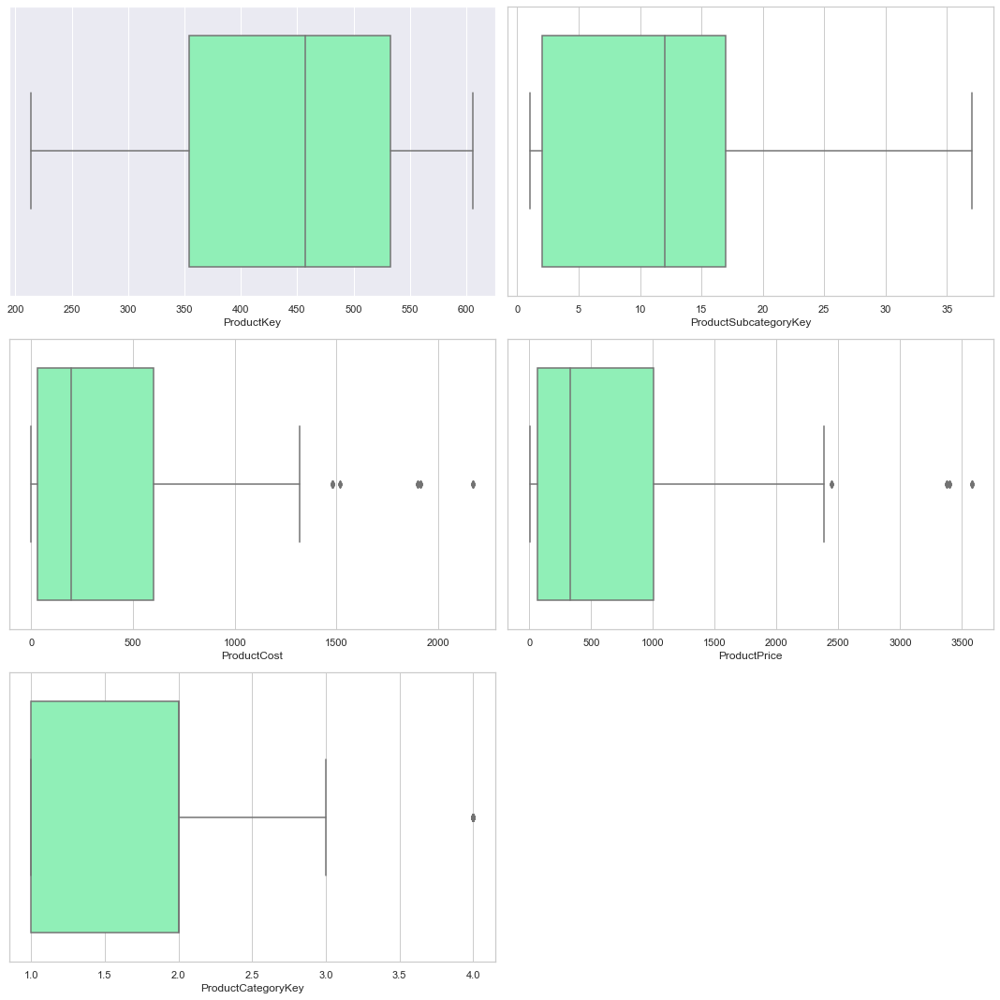

In [143]:
#boxplots to see outliers
data_columns = products._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(products[data_columns[i]],palette='rainbow',orient='v')
    plt.tight_layout()


## Sales

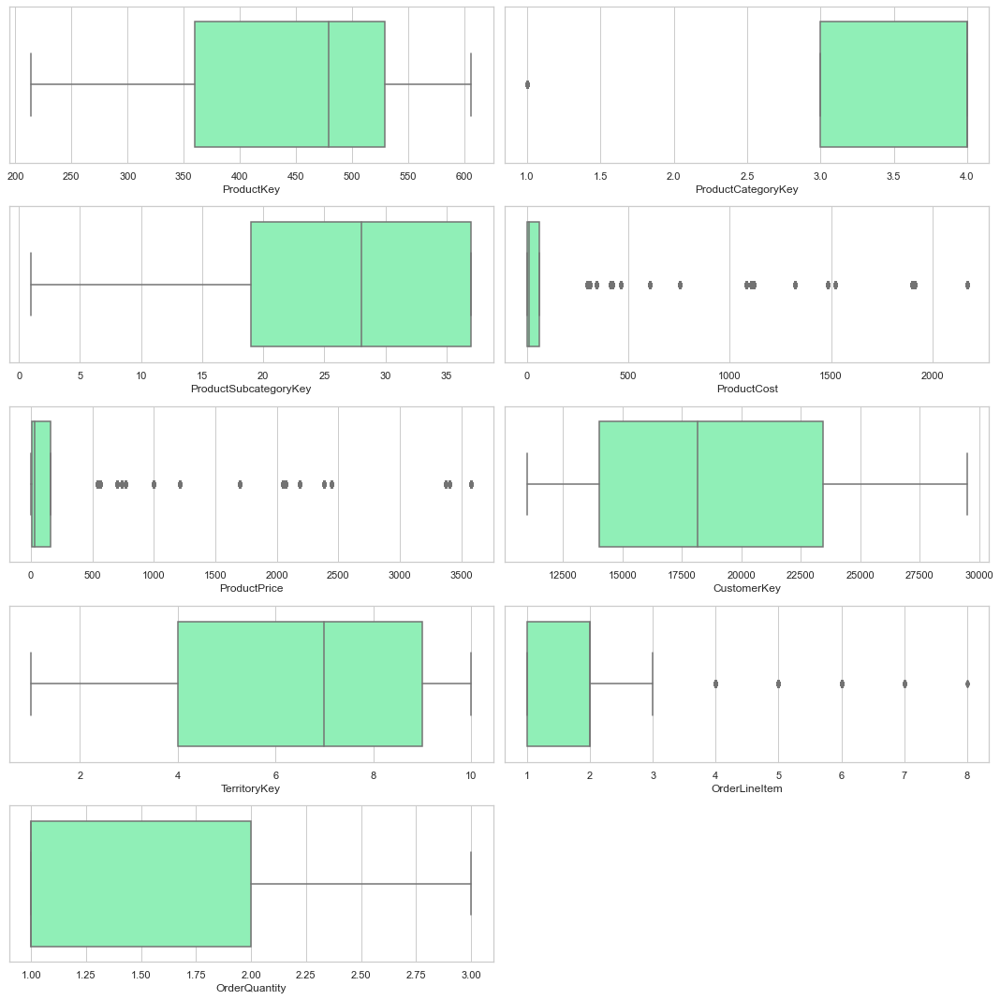

In [144]:
#boxplots to see outliers
data_columns = sales._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(sales[data_columns[i]],palette='rainbow')
    plt.tight_layout()

## Customers

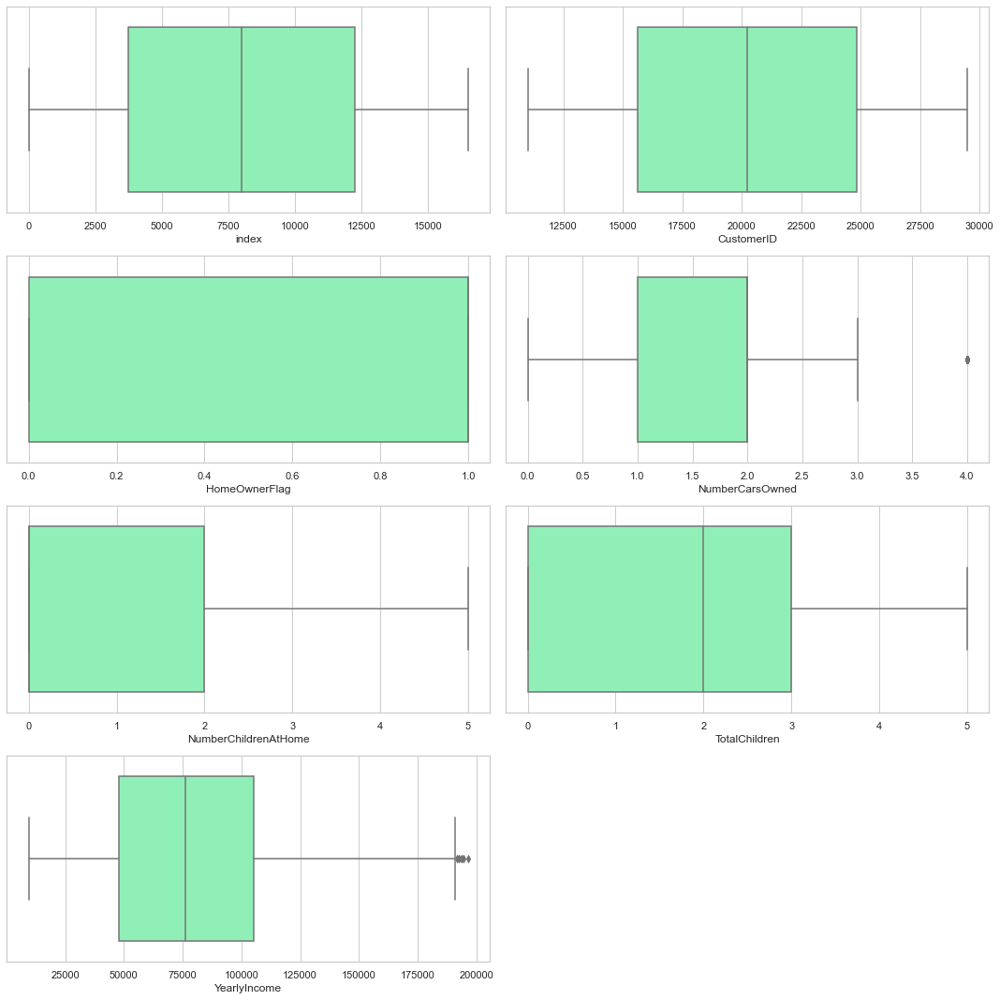

In [145]:
#boxplots to see outliers
data_columns = allcust._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(15,15))
for i in range(0,len(data_columns)):
    plt.subplot(number_of_columns, number_of_rows, i+1)
    sns.set_style('whitegrid')
    sns.boxplot(allcust[data_columns[i]],palette='rainbow')
    plt.tight_layout()

# Exploratory Data Analysis

## Products - Univariate

In [146]:
products.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 292
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ProductKey             293 non-null    int64  
 1   ProductSubcategoryKey  293 non-null    int64  
 2   ProductSKU             293 non-null    object 
 3   ProductName            293 non-null    object 
 4   ModelName              293 non-null    object 
 5   ProductDescription     293 non-null    object 
 6   ProductColor           243 non-null    object 
 7   ProductSize            293 non-null    object 
 8   ProductStyle           293 non-null    object 
 9   ProductCost            293 non-null    float64
 10  ProductPrice           293 non-null    float64
 11  SubcategoryName        293 non-null    object 
 12  ProductCategoryKey     293 non-null    int64  
 13  CategoryName           293 non-null    object 
dtypes: float64(2), int64(3), object(9)
memory usage: 34.3+ KB


In [147]:
for i in products.columns:
    print(i, products[i].nunique())

ProductKey 293
ProductSubcategoryKey 37
ProductSKU 293
ProductName 293
ModelName 119
ProductDescription 115
ProductColor 9
ProductSize 19
ProductStyle 4
ProductCost 111
ProductPrice 107
SubcategoryName 37
ProductCategoryKey 4
CategoryName 4


In [148]:
products.CategoryName.value_counts() # explore further

Components     132
Bikes           97
Clothing        35
Accessories     29
Name: CategoryName, dtype: int64

In [149]:
97+36+29

162

In [150]:
132/293

0.45051194539249145

In [151]:
products.SubcategoryName.value_counts() # too many subcats with 1 or only a few products, will leave out

Road Bikes           43
Mountain Bikes       32
Road Frames          31
Mountain Frames      28
Touring Bikes        22
Touring Frames       18
Wheels               14
Tires and Tubes      11
Saddles               9
Jerseys               8
Handlebars            8
Pedals                7
Shorts                7
Gloves                6
Socks                 4
Cranksets             3
Bottles and Cages     3
Vests                 3
Helmets               3
Bib-Shorts            3
Tights                3
Lights                3
Forks                 3
Headsets              3
Bottom Brackets       3
Derailleurs           2
Brakes                2
Pumps                 2
Fenders               1
Bike Stands           1
Hydration Packs       1
Cleaners              1
Panniers              1
Bike Racks            1
Chains                1
Caps                  1
Locks                 1
Name: SubcategoryName, dtype: int64

In [152]:
products.ProductSize.value_counts() #a lot of options and most have no size, will not use

0     84
44    29
48    25
52    16
42    15
58    13
38    12
L     11
40    11
62    11
M     11
60    11
46    11
50     9
54     9
S      9
XL     3
56     2
70     1
Name: ProductSize, dtype: int64

In [153]:
products.ProductStyle.value_counts() 
#style relates to the gender associated with the product, mostly unisex or unassigned so doesnt tell us much

U    174
0     84
W     28
M      7
Name: ProductStyle, dtype: int64

### Distributions

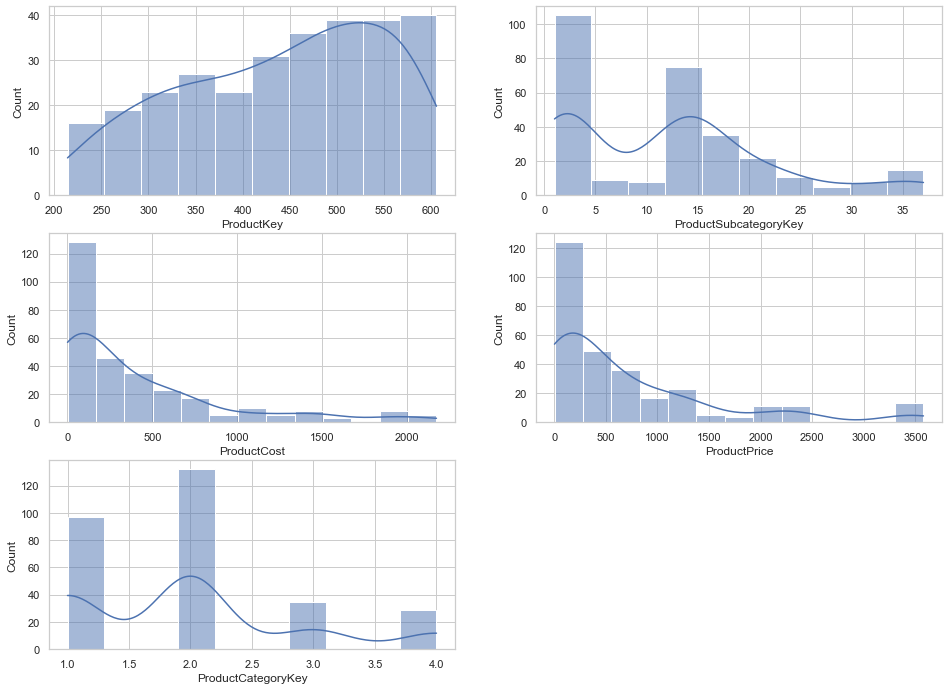

In [154]:
#numerical variables
data_columns = products._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(16,16))

# plot distribution
for i in range(0, len(data_columns)):
    plt.subplot(number_of_columns + 1, number_of_rows, i+1)
    sns.histplot(products[data_columns[i]], kde=True) 

In [155]:
products.CategoryName.value_counts()

Components     132
Bikes           97
Clothing        35
Accessories     29
Name: CategoryName, dtype: int64

In [156]:
products.ProductKey.nunique()

293

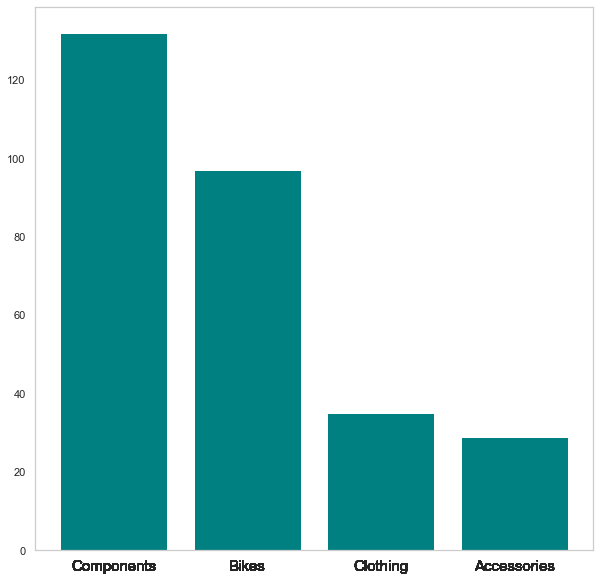

In [157]:
#number of products per category
plt.figure(figsize =(10,10))
plt.bar(products.CategoryName.value_counts().index, products.CategoryName.value_counts(), color="teal")
plt.xticks(products.CategoryName,rotation='horizontal', fontsize=15)
plt.grid(False)
plt.show()

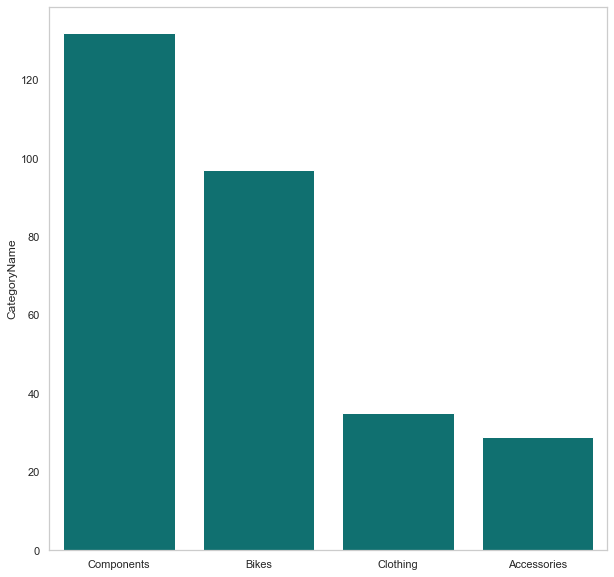

In [158]:
#number of products per category
plt.figure(figsize =(10,10))
sns.barplot(products.CategoryName.value_counts().index, products.CategoryName.value_counts(), color="teal")
plt.grid(False)
plt.show()

## Products - Bivariate

In [159]:
#PLAN
#avg cost per cat
#avg price per cat
#cost vs price
#correlation heatmap

In [160]:
costcat = products.groupby("CategoryName")["ProductCost"].mean()

In [161]:
costcat

CategoryName
Accessories     13.157145
Bikes          913.606404
Clothing        24.042431
Components     237.574335
Name: ProductCost, dtype: float64

In [162]:
pricecat = products.groupby("CategoryName")["ProductPrice"].mean()
pricecat

CategoryName
Accessories      34.256152
Bikes          1541.383524
Clothing         50.681077
Components      432.186952
Name: ProductPrice, dtype: float64

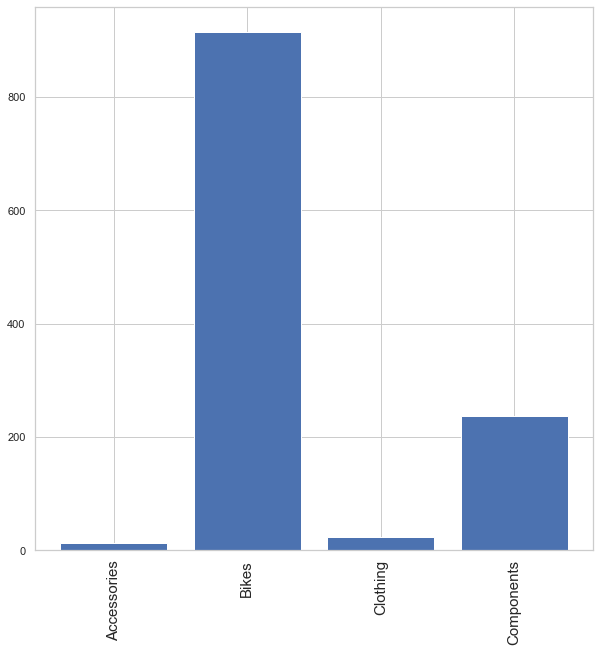

In [163]:
#average cost per category
plt.figure(figsize =(10,10))
plt.bar(costcat.index, costcat)
plt.xticks(costcat.index,rotation='vertical', fontsize=15)
plt.show()

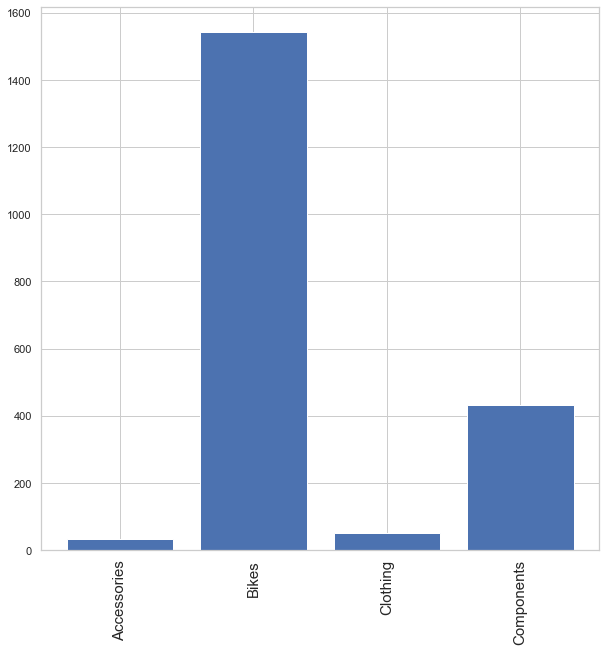

In [164]:
#average price per category
plt.figure(figsize =(10,10))
plt.bar(pricecat.index, pricecat)
plt.xticks(pricecat.index,rotation='vertical', fontsize=15)
plt.show()

### Pairplots

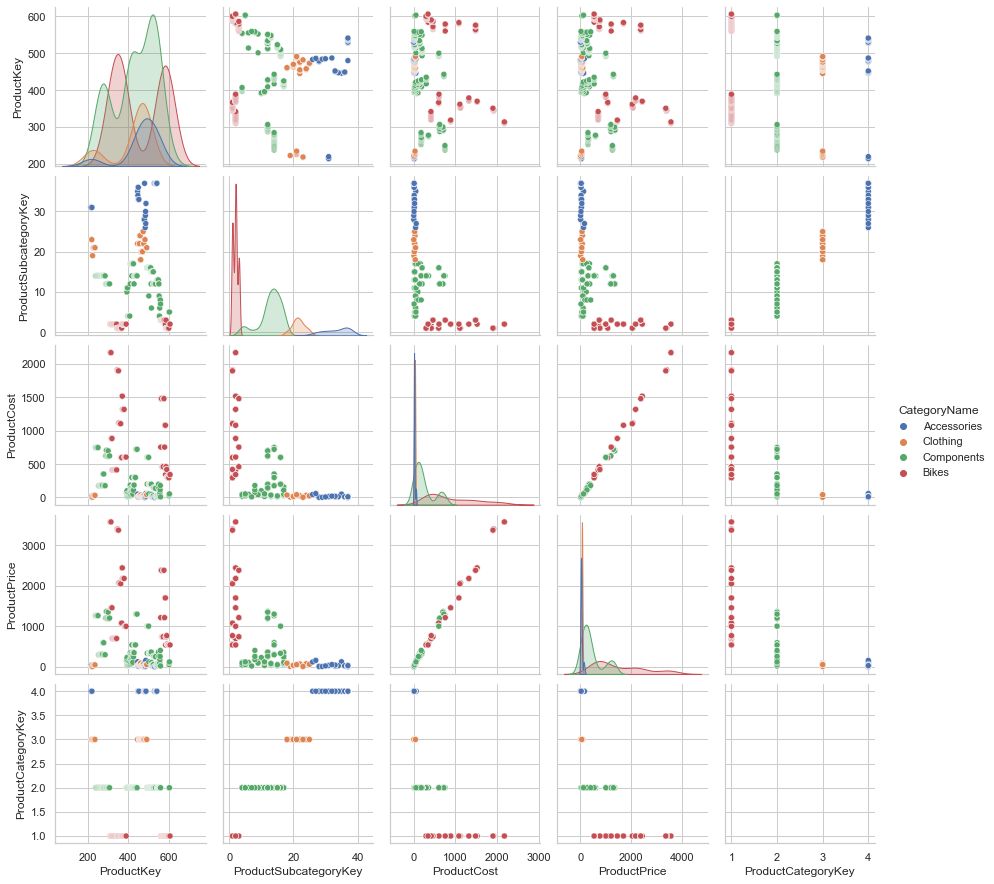

In [165]:
sns.pairplot(products,hue='CategoryName')

In [166]:
#price vs cost

fig = px.scatter(products, x="ProductCost", y="ProductPrice", color="CategoryName")
fig.show()

In [167]:
#price vs subcategory 

fig = px.scatter(products, x="ProductPrice", y="ProductSubcategoryKey", color="CategoryName")
fig.show()

### Correlation

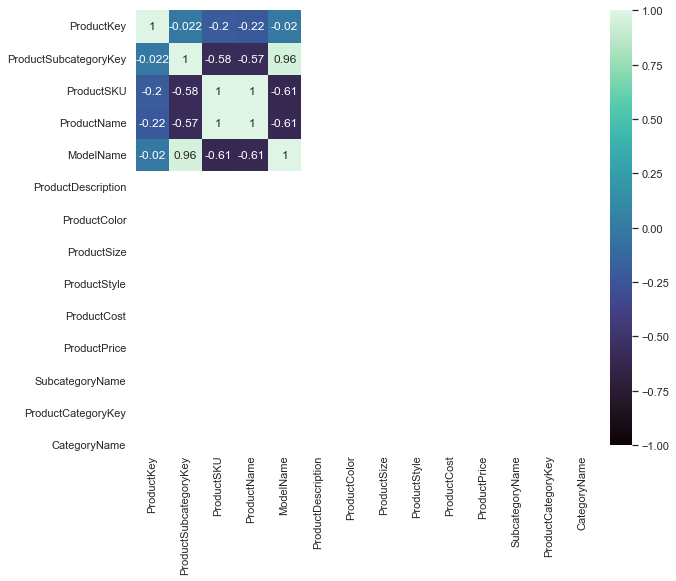

In [168]:
plt.figure(figsize=(10,8))
sns.heatmap(products.corr(),
           xticklabels = products.columns.values,
           yticklabels = products.columns.values,
           annot = True, vmax=1, vmin=-1, center=0,  cmap = 'mako')

plt.show()


In [169]:
# nothing of note

## Description Wordcloud

In [170]:
products.columns

Index(['ProductKey', 'ProductSubcategoryKey', 'ProductSKU', 'ProductName',
       'ModelName', 'ProductDescription', 'ProductColor', 'ProductSize',
       'ProductStyle', 'ProductCost', 'ProductPrice', 'SubcategoryName',
       'ProductCategoryKey', 'CategoryName'],
      dtype='object')

In [171]:
desc = products["ProductDescription"]
desc

0      Universal fit, well-vented, lightweight , snap...
1      Universal fit, well-vented, lightweight , snap...
2      Combination of natural and synthetic fibers st...
3      Combination of natural and synthetic fibers st...
4      Universal fit, well-vented, lightweight , snap...
                             ...                        
288         Aluminum alloy cups; large diameter spindle.
289               Aluminum alloy cups and a hollow axle.
290    Entry level adult bike; offers a comfortable r...
291    Entry level adult bike; offers a comfortable r...
292    Entry level adult bike; offers a comfortable r...
Name: ProductDescription, Length: 293, dtype: object

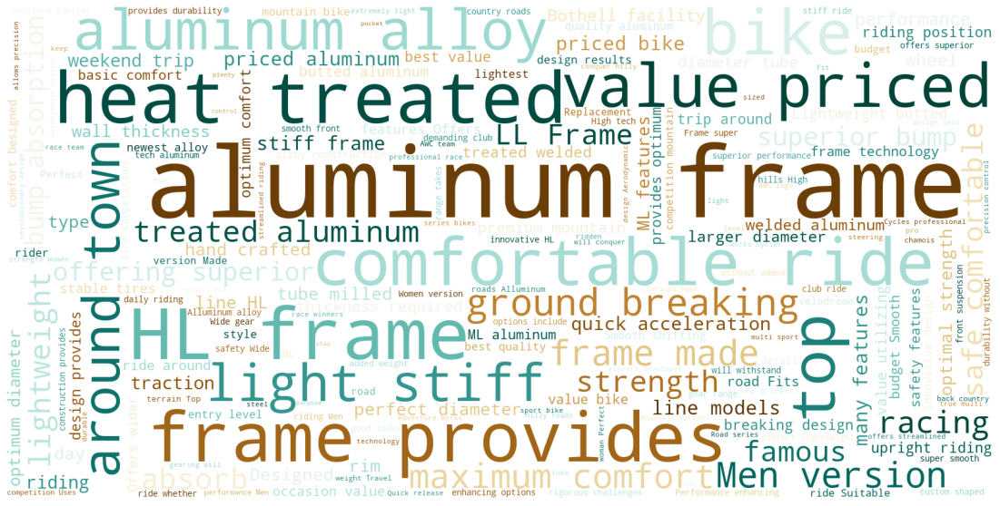

In [172]:
wordcloud = WordCloud(background_color='white',width=1600, height=800, colormap="BrBG")
wordcloud.generate(" ".join(desc))
plt.figure(figsize=(20,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('descriptionwordcloud.png')
plt.show()


## Customers - Univariate

In [173]:
allcust.head()

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,1966-04-08,Bachelors,Professional,M,M,1,0,0,2,137947
1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,1965-05-14,Bachelors,Professional,M,S,0,1,3,3,101141
2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,1965-08-12,Bachelors,Professional,M,M,1,1,3,3,91945
3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,1968-02-15,Bachelors,Professional,F,S,0,1,0,0,86688
4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,1968-08-08,Bachelors,Professional,F,S,1,4,5,5,92771


In [174]:
allcust.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16921 entries, 0 to 16920
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   index                 16921 non-null  int64 
 1   CustomerID            16921 non-null  int64 
 2   FirstName             16921 non-null  object
 3   LastName              16921 non-null  object
 4   AddressLine1          16921 non-null  object
 5   City                  16921 non-null  object
 6   StateProvinceName     16921 non-null  object
 7   CountryRegionName     16921 non-null  object
 8   PostalCode            16921 non-null  object
 9   PhoneNumber           16921 non-null  object
 10  BirthDate             16921 non-null  object
 11  Education             16921 non-null  object
 12  Occupation            16921 non-null  object
 13  Gender                16921 non-null  object
 14  MaritalStatus         16921 non-null  object
 15  HomeOwnerFlag         16921 non-null

In [175]:
for i in allcust.columns:
    print(i, allcust[i].nunique())

index 16421
CustomerID 16900
FirstName 663
LastName 368
AddressLine1 12106
City 272
StateProvinceName 52
CountryRegionName 6
PostalCode 326
PhoneNumber 8184
BirthDate 8387
Education 5
Occupation 5
Gender 2
MaritalStatus 2
HomeOwnerFlag 2
NumberCarsOwned 5
NumberChildrenAtHome 6
TotalChildren 6
YearlyIncome 15929


In [176]:
#adding an age column at the time
allcust.BirthDate = pd.to_datetime(allcust.BirthDate)

In [177]:
allcust["BirthDate"]

0       1966-04-08
1       1965-05-14
2       1965-08-12
3       1968-02-15
4       1968-08-08
           ...    
16916   1969-01-18
16917   1950-04-26
16918   1937-11-18
16919   1957-04-11
16920   1947-03-18
Name: BirthDate, Length: 16921, dtype: datetime64[ns]

In [178]:
sales["OrderDate"].max()

'9/9/2016'

In [179]:
enddate = pd.to_datetime("2017-06-30")

In [180]:
allcust["Age"] = enddate - allcust["BirthDate"]

In [181]:
allcust["Age"]

0       18711 days
1       19040 days
2       18950 days
3       18033 days
4       17858 days
           ...    
16916   17695 days
16917   24537 days
16918   29079 days
16919   21995 days
16920   25672 days
Name: Age, Length: 16921, dtype: timedelta64[ns]

In [182]:
allcust["Age"] = allcust["Age"].astype('<m8[Y]')

In [183]:
allcust["Age"]

0        51.0
1        52.0
2        51.0
3        49.0
4        48.0
         ... 
16916    48.0
16917    67.0
16918    79.0
16919    60.0
16920    70.0
Name: Age, Length: 16921, dtype: float64

In [184]:
allcust.columns

Index(['index', 'CustomerID', 'FirstName', 'LastName', 'AddressLine1', 'City',
       'StateProvinceName', 'CountryRegionName', 'PostalCode', 'PhoneNumber',
       'BirthDate', 'Education', 'Occupation', 'Gender', 'MaritalStatus',
       'HomeOwnerFlag', 'NumberCarsOwned', 'NumberChildrenAtHome',
       'TotalChildren', 'YearlyIncome', 'Age'],
      dtype='object')

### Distributions

In [185]:
#check distribution of numericals

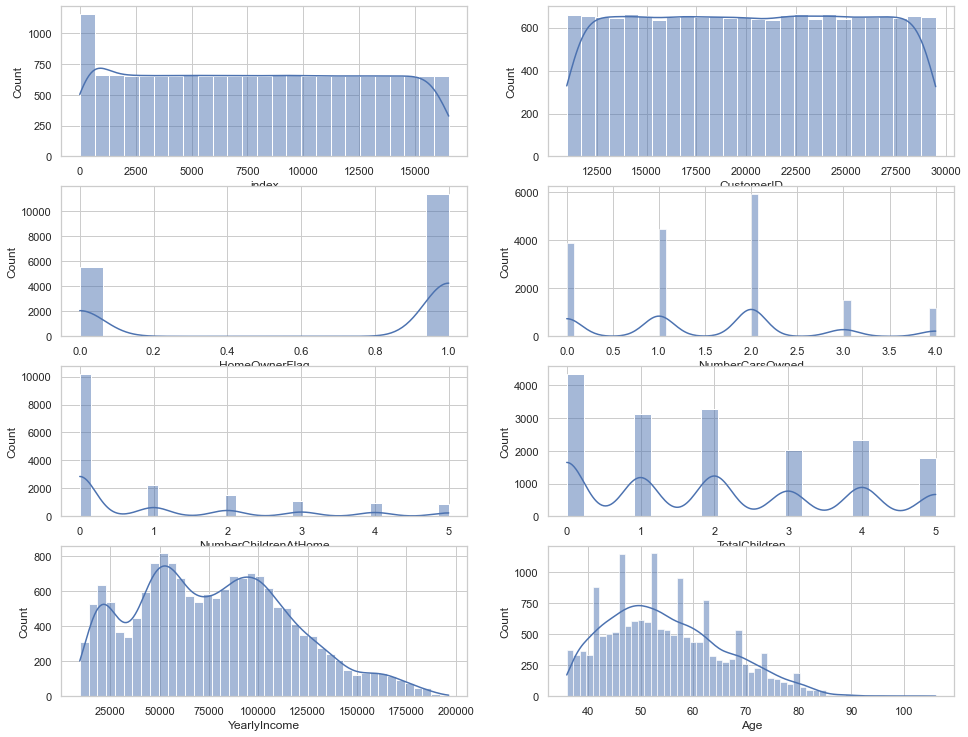

In [186]:
#numerical variables
data_columns = allcust._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(16,16))

# plot distribution
for i in range(0, len(data_columns)):
    plt.subplot(number_of_columns + 1, number_of_rows, i+1)
    sns.histplot(allcust[data_columns[i]], kde=True) 

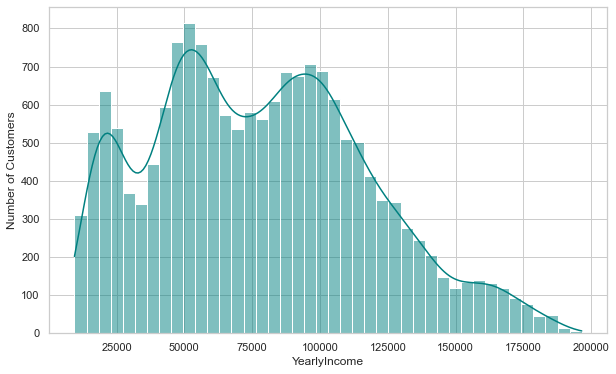

In [187]:
plt.figure(figsize =(10,6))
sns.histplot(allcust["YearlyIncome"], kde=True, color="teal")
plt.ylabel("Number of Customers")
plt.show()

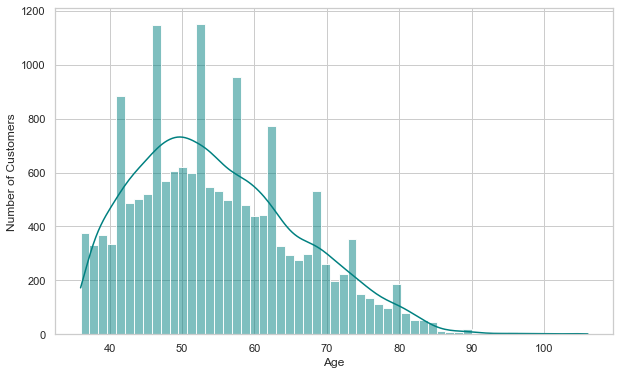

In [188]:
plt.figure(figsize =(10,6))
sns.histplot(allcust["Age"], kde=True, color="teal")
plt.ylabel("Number of Customers")
plt.show()

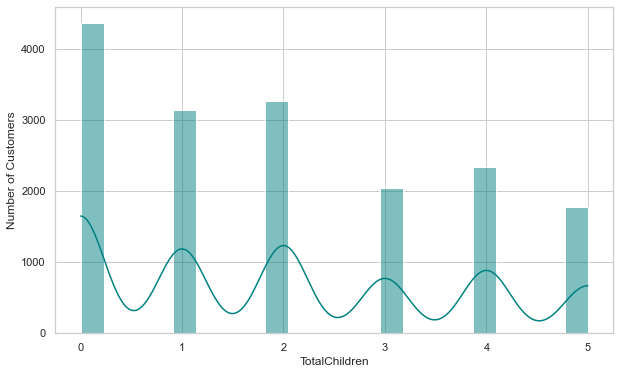

In [189]:
plt.figure(figsize =(10,6))
sns.histplot(allcust["TotalChildren"], kde=True, color="teal")
plt.ylabel("Number of Customers")
plt.show()

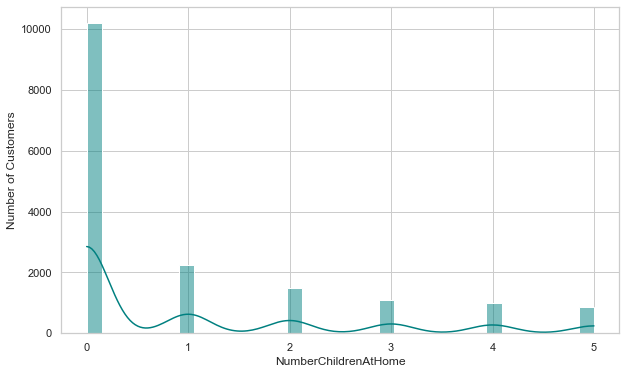

In [190]:
plt.figure(figsize =(10,6))
sns.histplot(allcust["NumberChildrenAtHome"], kde=True, color="teal")
plt.ylabel("Number of Customers")
plt.show()

In [191]:
#bar charts for categorical variables

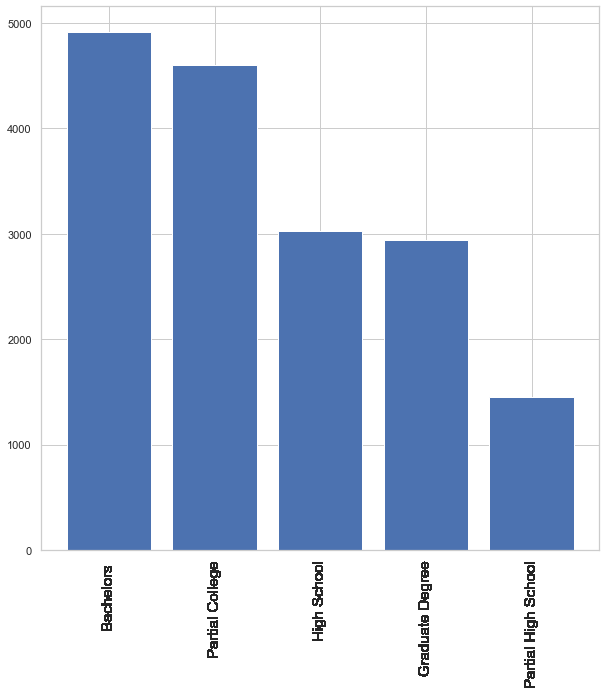

In [192]:
#education dist
plt.figure(figsize =(10,10))
plt.bar(allcust.Education.value_counts().index, allcust.Education.value_counts())
plt.xticks(allcust.Education,rotation='vertical', fontsize=15)
plt.show()

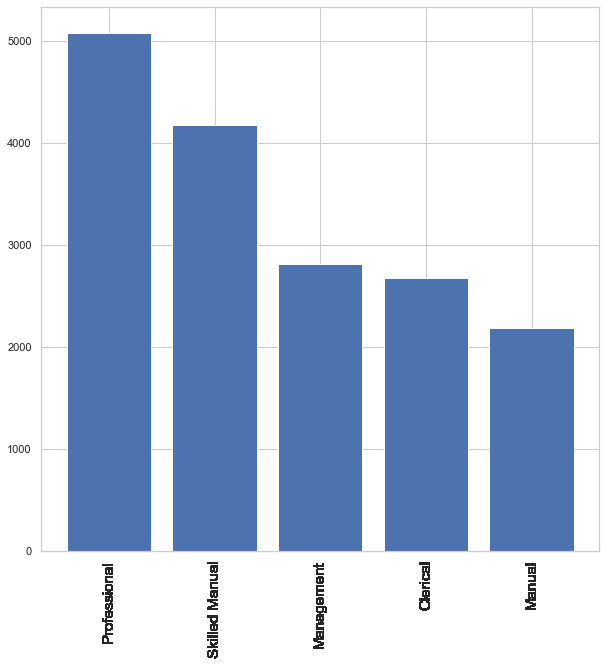

In [193]:
#occupation dist
plt.figure(figsize =(10,10))
plt.bar(allcust.Occupation.value_counts().index, allcust.Occupation.value_counts())
plt.xticks(allcust.Occupation,rotation='vertical', fontsize=15)
plt.show()

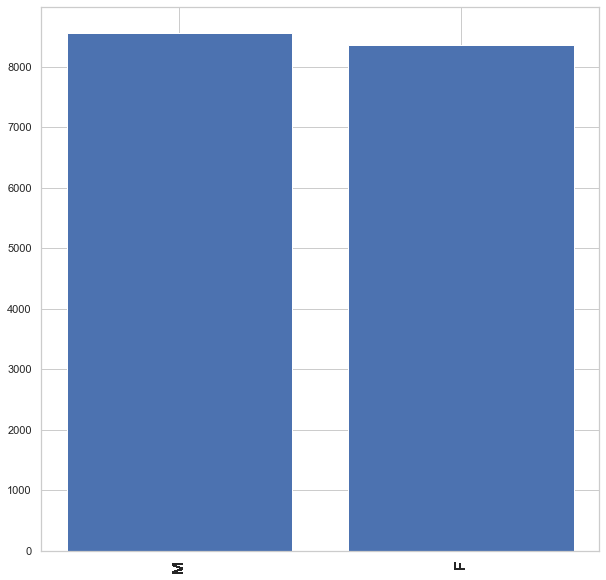

In [194]:
#gender dist
plt.figure(figsize =(10,10))
plt.bar(allcust.Gender.value_counts().index, allcust.Gender.value_counts())
plt.xticks(allcust.Gender,rotation='vertical', fontsize=15)
plt.show()

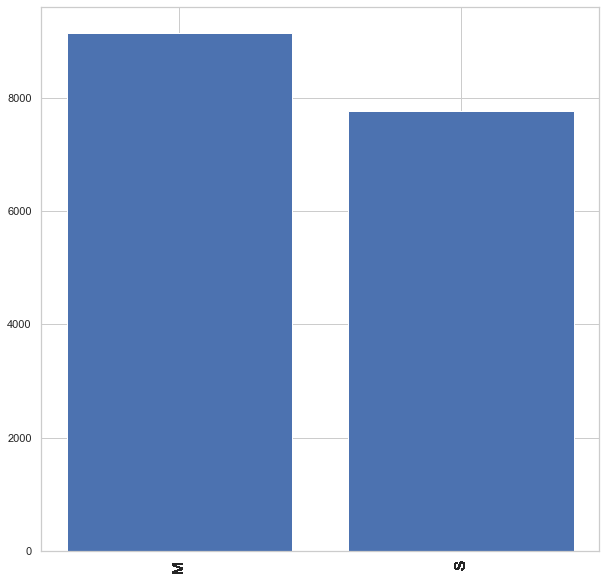

In [195]:
#marital status dist
plt.figure(figsize =(10,10))
plt.bar(allcust.MaritalStatus.value_counts().index, allcust.MaritalStatus.value_counts())
plt.xticks(allcust.MaritalStatus,rotation='vertical', fontsize=15)
plt.show()

most of our customers are married but it's not a big difference

### Map

In [196]:
#map for customer locations

In [197]:
allcust.head()

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,...,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,...,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,...,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,...,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,...,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [198]:
allcust.CountryRegionName.value_counts()

United States     7177
Australia         3280
United Kingdom    1753
France            1638
Germany           1626
Canada            1447
Name: CountryRegionName, dtype: int64

In [199]:
countries = allcust.CountryRegionName.value_counts()

In [200]:
fig = px.choropleth(countries, 
                  locations=countries.index, locationmode="country names",
                   color=countries,
                  color_continuous_scale= ['coral', 'teal'])
fig.update_layout(title_text = "Where are our customers?")
fig.show()


In [201]:
allcust.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16921 entries, 0 to 16920
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   index                 16921 non-null  int64         
 1   CustomerID            16921 non-null  int64         
 2   FirstName             16921 non-null  object        
 3   LastName              16921 non-null  object        
 4   AddressLine1          16921 non-null  object        
 5   City                  16921 non-null  object        
 6   StateProvinceName     16921 non-null  object        
 7   CountryRegionName     16921 non-null  object        
 8   PostalCode            16921 non-null  object        
 9   PhoneNumber           16921 non-null  object        
 10  BirthDate             16921 non-null  datetime64[ns]
 11  Education             16921 non-null  object        
 12  Occupation            16921 non-null  object        
 13  Gender          

In [202]:
allcust.City.value_counts() # too many options to be useful

London       386
Paris        347
Burien       197
Concord      195
Beaverton    192
            ... 
Byron          1
Chehalis       1
Chantilly      1
Clarkston      1
Cheyenne       1
Name: City, Length: 272, dtype: int64

## Customers - Bivariate

### Pairplots

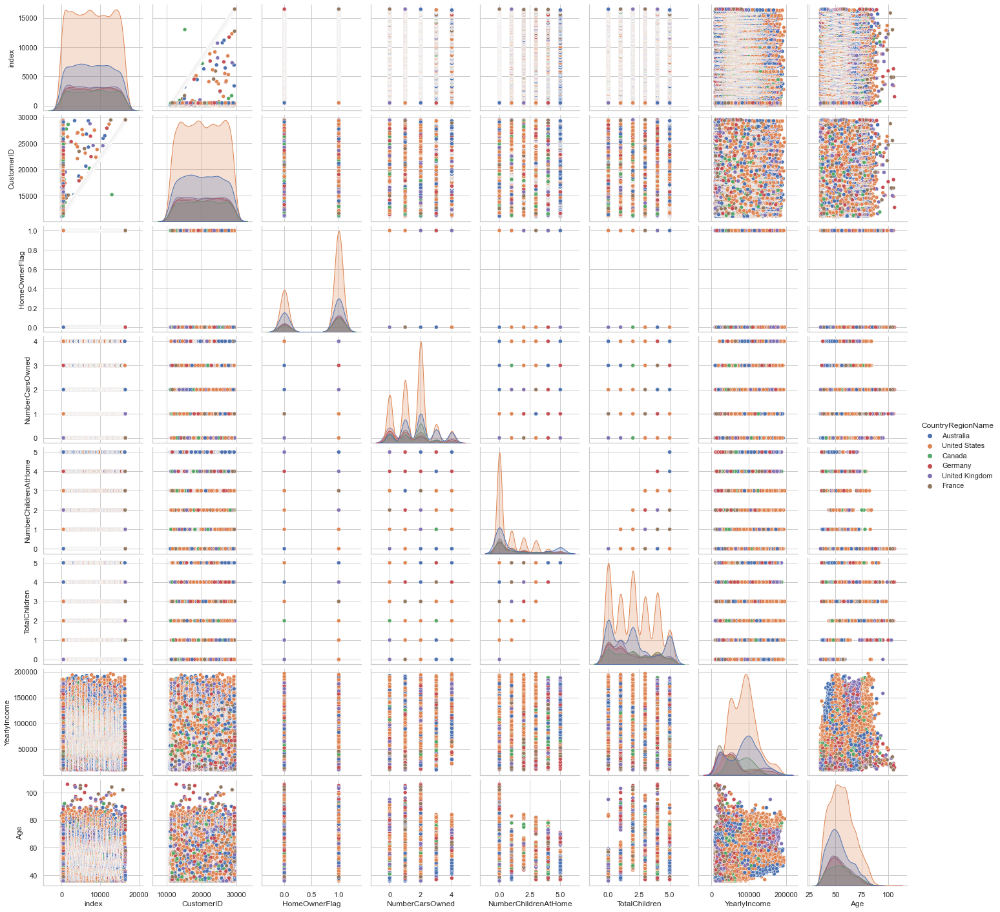

In [203]:
sns.pairplot(allcust,hue='CountryRegionName')

In [204]:
# re do univar dist num cars, num children, yearly income, age

In [205]:
allcust.columns

Index(['index', 'CustomerID', 'FirstName', 'LastName', 'AddressLine1', 'City',
       'StateProvinceName', 'CountryRegionName', 'PostalCode', 'PhoneNumber',
       'BirthDate', 'Education', 'Occupation', 'Gender', 'MaritalStatus',
       'HomeOwnerFlag', 'NumberCarsOwned', 'NumberChildrenAtHome',
       'TotalChildren', 'YearlyIncome', 'Age'],
      dtype='object')

<AxesSubplot:xlabel='NumberCarsOwned', ylabel='Density'>

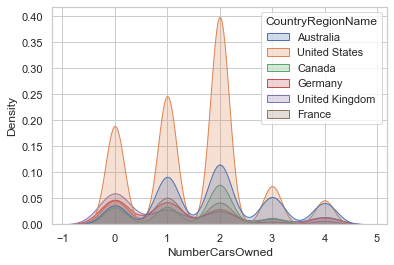

In [206]:
sns.kdeplot(allcust.NumberCarsOwned,shade=True, hue=allcust.CountryRegionName)

<AxesSubplot:xlabel='TotalChildren', ylabel='Density'>

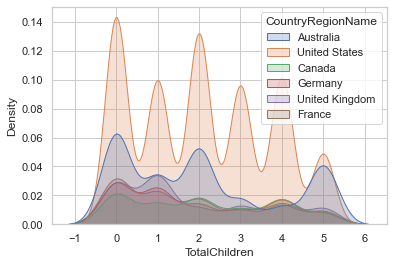

In [207]:
sns.kdeplot(allcust.TotalChildren,shade=True, hue=allcust.CountryRegionName)

<AxesSubplot:xlabel='NumberChildrenAtHome', ylabel='Density'>

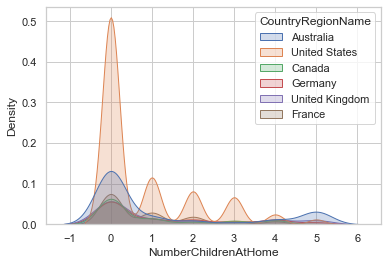

In [208]:
sns.kdeplot(allcust.NumberChildrenAtHome,shade=True, hue=allcust.CountryRegionName)

<AxesSubplot:xlabel='YearlyIncome', ylabel='Density'>

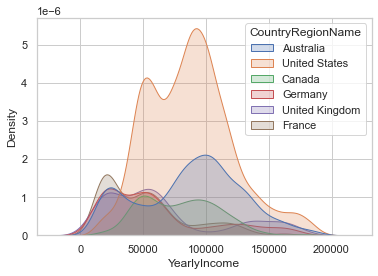

In [209]:
sns.kdeplot(allcust.YearlyIncome,shade=True, hue=allcust.CountryRegionName)

<AxesSubplot:xlabel='Age', ylabel='Density'>

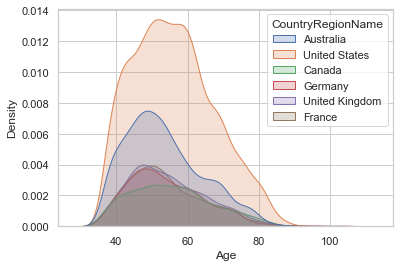

In [210]:
sns.kdeplot(allcust.Age,shade=True, hue=allcust.CountryRegionName)

In [211]:
# yearly income vs age
fig = px.scatter(allcust, x="YearlyIncome", y="Age", color="CountryRegionName")
fig.show()

### Correlation

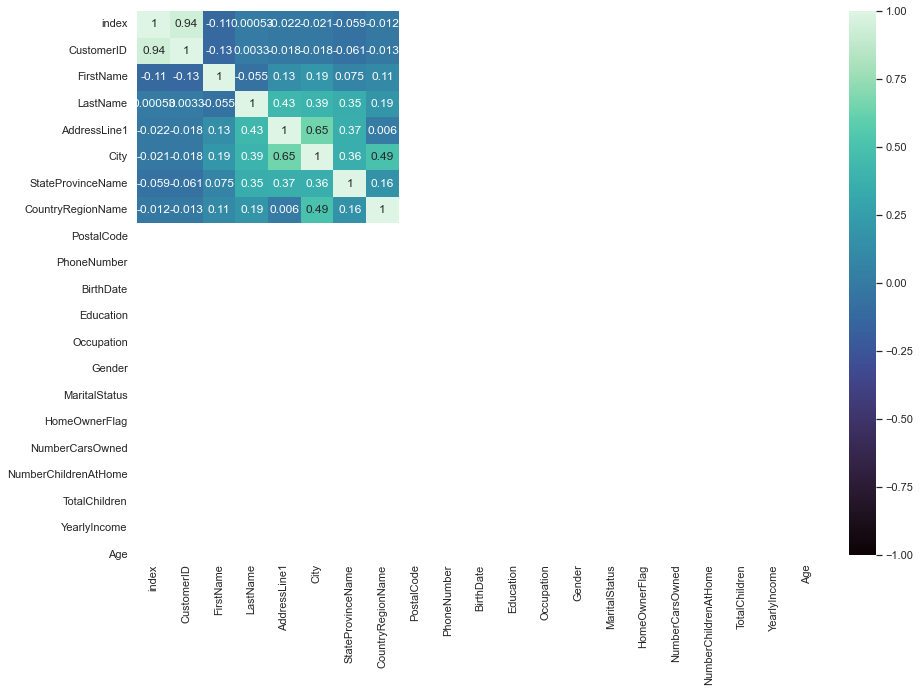

In [212]:
plt.figure(figsize=(15,10))
sns.heatmap(allcust.corr(),
           xticklabels = allcust.columns.values,
           yticklabels = allcust.columns.values,
           annot = True, vmax=1, vmin=-1, center=0,  cmap = 'mako')

plt.show()

## Sales - Univariate

In [213]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56046 entries, 0 to 56045
Data columns (total 17 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   OrderDate              56046 non-null  object 
 1   StockDate              56046 non-null  object 
 2   OrderNumber            56046 non-null  object 
 3   ProductKey             56046 non-null  int64  
 4   ProductCategoryKey     56046 non-null  int64  
 5   CategoryName           56046 non-null  object 
 6   ProductSubcategoryKey  56046 non-null  int64  
 7   SubcategoryName        56046 non-null  object 
 8   ProductCost            56046 non-null  float64
 9   ProductPrice           56046 non-null  float64
 10  CustomerKey            56046 non-null  int64  
 11  TerritoryKey           56046 non-null  int64  
 12  Region                 56046 non-null  object 
 13  Country                56046 non-null  object 
 14  Continent              56046 non-null  object 
 15  Or

In [214]:
sales.describe()

,ProductKey,ProductCategoryKey,ProductSubcategoryKey,ProductCost,ProductPrice,CustomerKey,TerritoryKey,OrderLineItem,OrderQuantity
count,56046.000000,56046.000000,56046.000000,56046.000000,56046.000000,56046.000000,56046.000000,56046.000000,56046.000000
mean,438.962103,3.102576,23.412982,255.750403,438.969347,18843.645559,6.254666,1.903151,1.501873
std,118.612352,1.258273,13.493235,496.192920,838.650049,5412.449843,2.958005,1.021006,0.612379
min,214.000000,1.000000,1.000000,0.856500,2.290000,11000.000000,1.000000,1.000000,1.000000
25%,360.000000,3.000000,19.000000,2.973300,7.950000,14016.000000,4.000000,1.000000,1.000000
50%,479.000000,4.000000,28.000000,11.216300,29.990000,18157.000000,7.000000,2.000000,1.000000
75%,529.000000,4.000000,37.000000,59.466000,159.000000,23425.750000,9.000000,2.000000,2.000000
max,606.000000,4.000000,37.000000,2171.294200,3578.270000,29483.000000,10.000000,8.000000,3.000000


In [215]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,CustomerKey,TerritoryKey,Region,Country,Continent,OrderLineItem,OrderQuantity
0,1/1/2015,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,14657,1,Northwest,United States,North America,1,1
1,1/1/2015,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,29255,4,Southwest,United States,North America,1,1
2,1/1/2015,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,11455,9,Australia,Australia,Pacific,1,1
3,1/1/2015,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,26782,6,Canada,Canada,North America,1,1
4,1/2/2015,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,14947,10,United Kingdom,United Kingdom,Europe,1,1


### Distributions

In [216]:
#check distribution of numericals

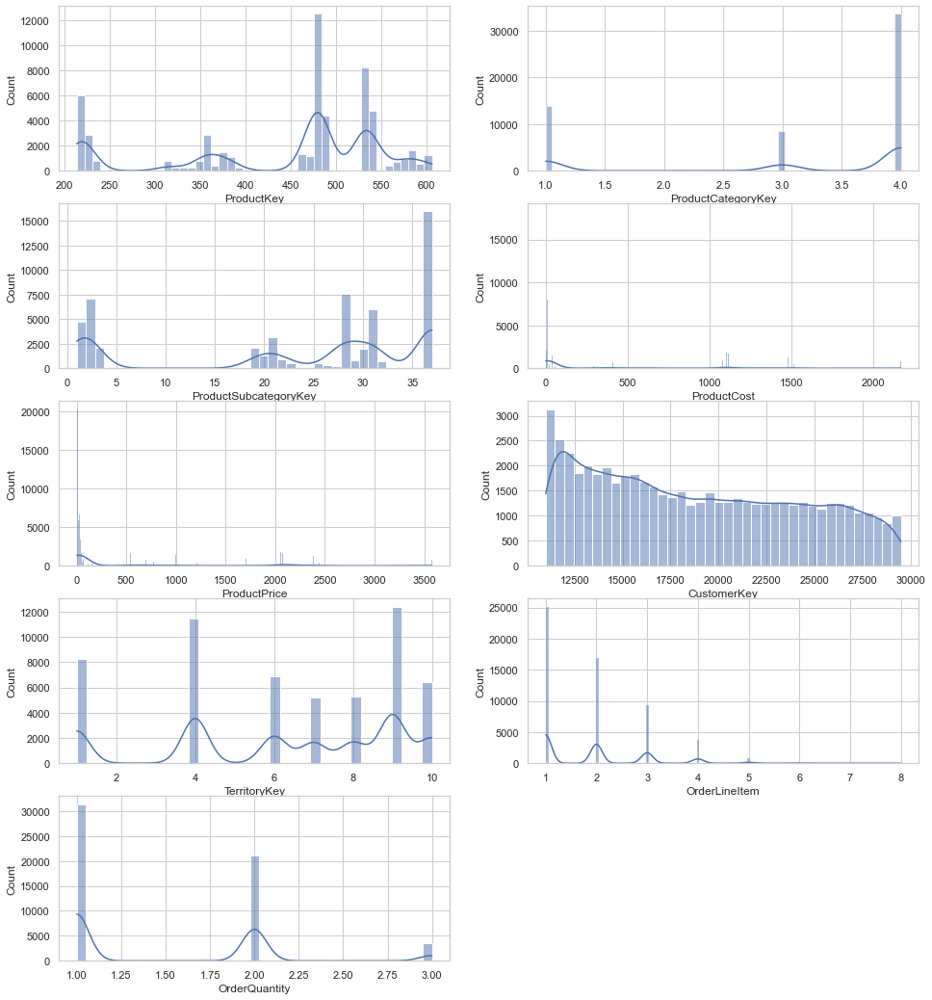

In [217]:
#numerical variables
data_columns = sales._get_numeric_data().columns.values
plot_columns = 2
number_of_columns = math.ceil(len(data_columns)/plot_columns)
number_of_rows = math.ceil((len(data_columns))/number_of_columns)

plt.figure(figsize=(16,22))

# plot distribution
for i in range(0, len(data_columns)):
    plt.subplot(number_of_columns + 1, number_of_rows, i+1)
    sns.histplot(sales[data_columns[i]], kde=True) 

In [218]:
# check separately: cost, price
# calc order value: price * qty
# calc items per order and value per order


In [219]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity'],
      dtype='object')

In [220]:
sales["OrderValue"] = sales["OrderQuantity"]* sales["ProductPrice"]

In [221]:
sales["OrderValue"]

0         699.0982
1        3578.2700
2        3374.9900
3         699.0982
4        3578.2700
           ...    
56041       9.9800
56042       8.9900
56043     539.9900
56044       4.5800
56045      42.9800
Name: OrderValue, Length: 56046, dtype: float64

In [222]:
sales["OrderProfit"] = sales["OrderValue"] - (sales["OrderQuantity"]*sales["ProductCost"])

In [223]:
sales["OrderProfit"]

0         285.9519
1        1406.9758
2        1476.8956
3         285.9519
4        1406.9758
           ...    
56041       6.2474
56042       5.6277
56043     196.3404
56044       2.8670
56045      26.9054
Name: OrderProfit, Length: 56046, dtype: float64

<AxesSubplot:xlabel='ProductCost', ylabel='Count'>

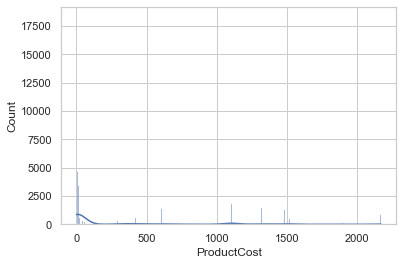

In [224]:
sns.histplot(sales["ProductCost"], kde=True)

<AxesSubplot:xlabel='ProductPrice', ylabel='Count'>

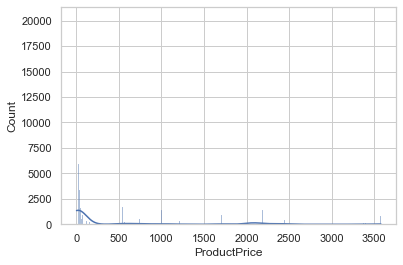

In [225]:
sns.histplot(sales["ProductPrice"], kde=True)

<AxesSubplot:xlabel='OrderQuantity', ylabel='Count'>

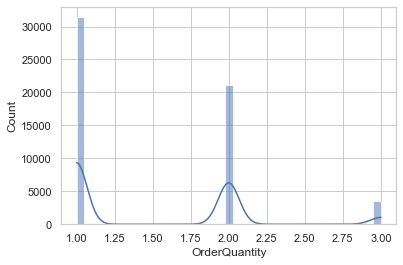

In [226]:
sns.histplot(sales["OrderQuantity"], kde=True) # this is qty of the same product we want to look at qty of items per order

<AxesSubplot:xlabel='OrderValue', ylabel='Count'>

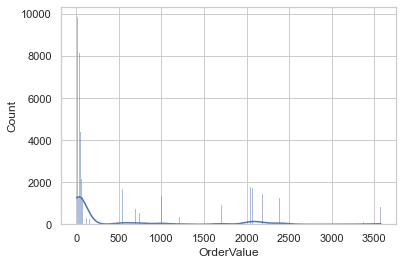

In [227]:
sns.histplot(sales["OrderValue"], kde=True) # same issue here

In [228]:
orders = sales.groupby("OrderNumber")["OrderQuantity","OrderValue","OrderProfit"].sum()

In [229]:
orders

,OrderQuantity,OrderValue,OrderProfit
OrderNumber,,,
SO45079,1,3578.2700,1406.9758
SO45080,1,699.0982,285.9519
SO45081,1,699.0982,285.9519
SO45082,1,3374.9900,1476.8956
SO45083,1,3578.2700,1406.9758
...,...,...,...
SO74143,6,606.0562,235.8845
SO74144,2,2417.7142,923.7485
SO74145,1,2384.0700,902.1321


<AxesSubplot:xlabel='OrderValue', ylabel='Count'>

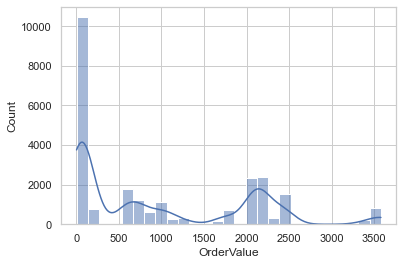

In [230]:
sns.histplot(orders["OrderValue"], kde=True)

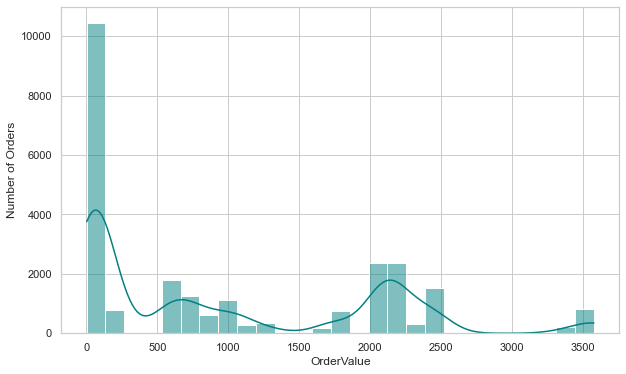

In [231]:
plt.figure(figsize =(10,6))
sns.histplot(orders["OrderValue"], kde=True, color="teal")
plt.ylabel("Number of Orders")
plt.show()

<AxesSubplot:xlabel='OrderQuantity', ylabel='Count'>

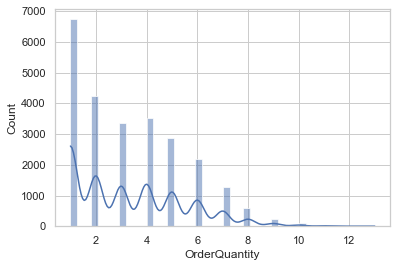

In [232]:
sns.histplot(orders["OrderQuantity"], kde=True)

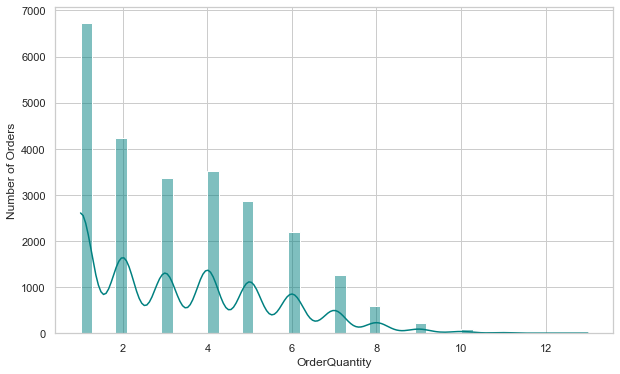

In [233]:
plt.figure(figsize =(10,6))
sns.histplot(orders["OrderQuantity"], kde=True, color="teal")
plt.ylabel("Number of Orders")
plt.show()

<AxesSubplot:xlabel='OrderProfit', ylabel='Count'>

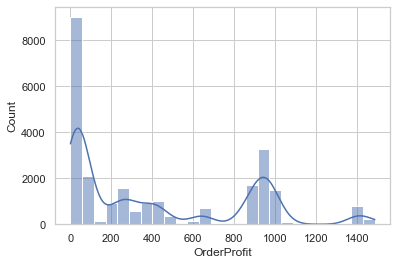

In [234]:
sns.histplot(orders["OrderProfit"], kde=True)

## Sales - Bivariate

### Pairplots

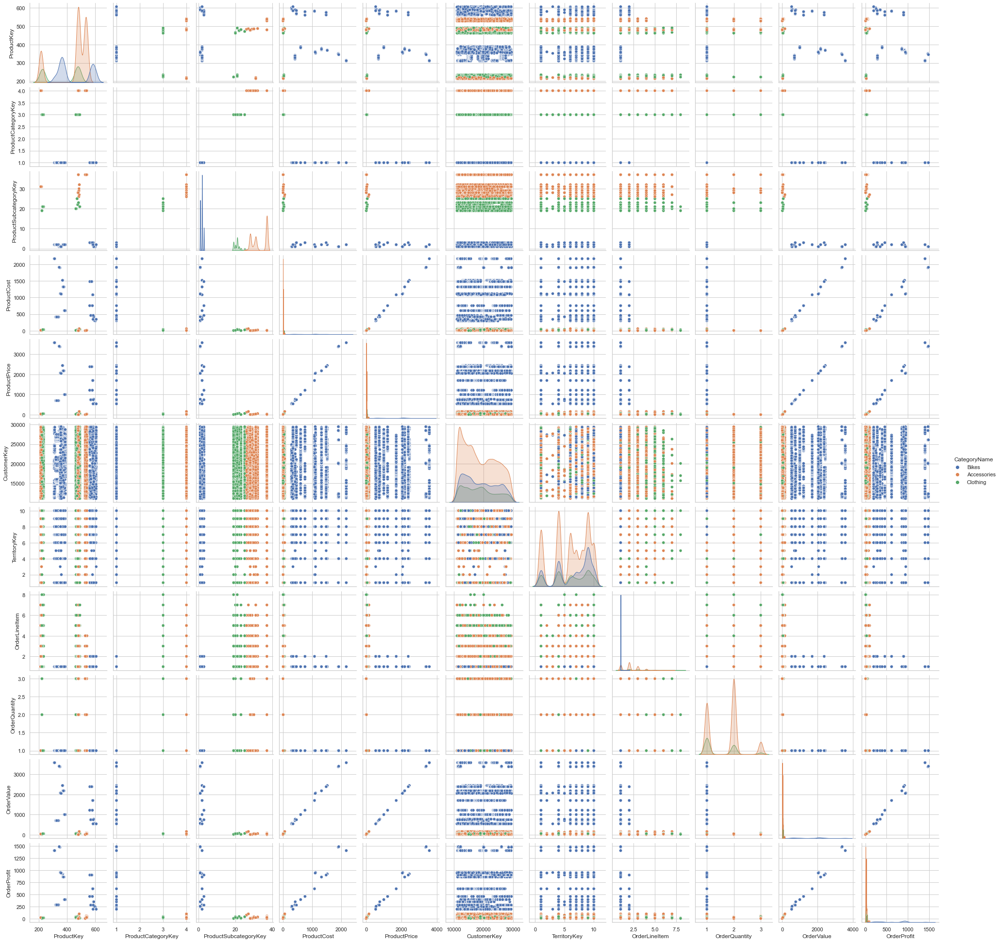

In [235]:
sns.pairplot(sales,hue='CategoryName')

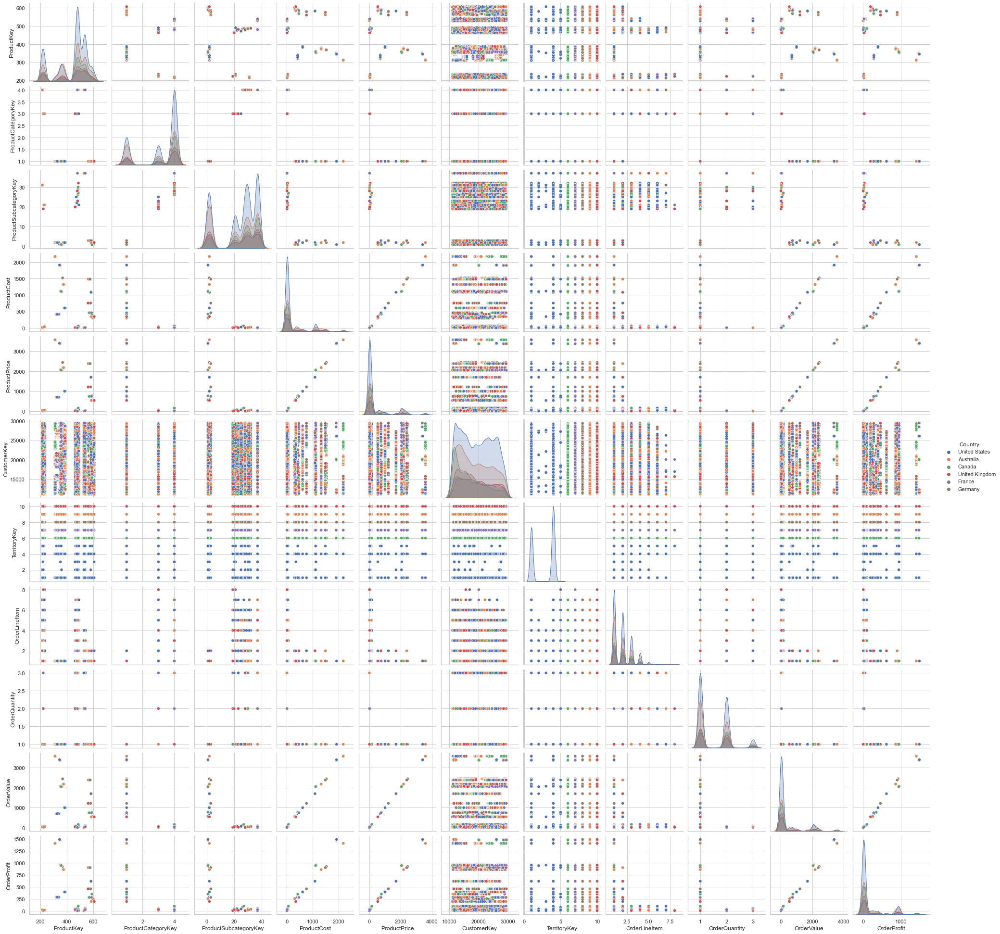

In [236]:
sns.pairplot(sales,hue='Country')

### Correlation

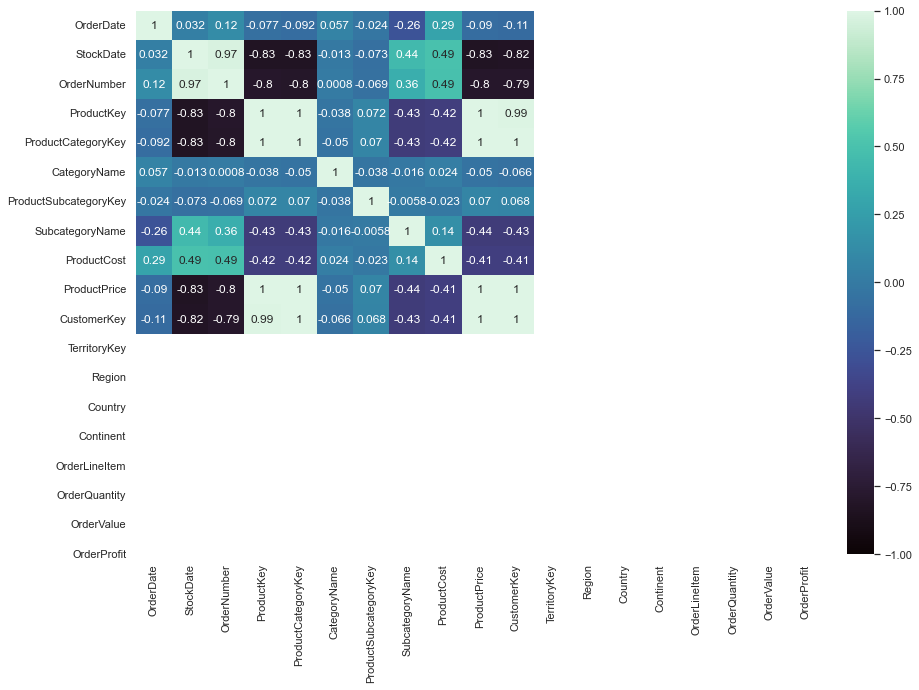

In [237]:
plt.figure(figsize=(15,10))
sns.heatmap(sales.corr(),
           xticklabels = sales.columns.values,
           yticklabels = sales.columns.values,
           annot = True, vmax=1, vmin=-1, center=0,  cmap = 'mako')

plt.show()

In [238]:
# quite weird relationship between things that would not be expected to be correlated

### Best selling Categories

In [239]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit'],
      dtype='object')

In [240]:
salesbycat = sales.groupby("CategoryName")["OrderQuantity","OrderValue","OrderProfit"].sum()

In [241]:
salesbycat

,OrderQuantity,OrderValue,OrderProfit
CategoryName,,,
Accessories,57809,9.066731e+05,5.697601e+05
Bikes,13929,2.364250e+07,9.726168e+06
Clothing,12436,3.654186e+05,1.617871e+05


In [242]:
salesbycat["OrderValue(k)"] = round((salesbycat["OrderValue"]/1000),2)

In [243]:
salesbycat.reset_index(inplace=True)

In [244]:
px.bar(salesbycat, x="CategoryName", y="OrderValue(k)")

In [245]:
# we make the most revenue from bikes

In [246]:
# order date

In [247]:
sales.OrderDate = pd.to_datetime(sales.OrderDate)

In [248]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 56046 entries, 0 to 56045
Data columns (total 19 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   OrderDate              56046 non-null  datetime64[ns]
 1   StockDate              56046 non-null  object        
 2   OrderNumber            56046 non-null  object        
 3   ProductKey             56046 non-null  int64         
 4   ProductCategoryKey     56046 non-null  int64         
 5   CategoryName           56046 non-null  object        
 6   ProductSubcategoryKey  56046 non-null  int64         
 7   SubcategoryName        56046 non-null  object        
 8   ProductCost            56046 non-null  float64       
 9   ProductPrice           56046 non-null  float64       
 10  CustomerKey            56046 non-null  int64         
 11  TerritoryKey           56046 non-null  int64         
 12  Region                 56046 non-null  object        
 13  C

In [249]:
sales["year"] = sales["OrderDate"].dt.year
sales["month"] = sales["OrderDate"].dt.month
sales["week"] = sales["OrderDate"].dt.week

In [250]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [251]:
salesbycatbyyear = sales.groupby(["CategoryName","year"])["OrderQuantity","OrderValue","OrderProfit"].sum()

In [252]:
salesbycatbyyear.reset_index(inplace=True)

In [253]:
salesbycatbyyear

,CategoryName,year,OrderQuantity,OrderValue,OrderProfit
0,Accessories,2016,25316,3.993421e+05,2.509361e+05
1,Accessories,2017,32493,5.073310e+05,3.188239e+05
2,Bikes,2015,2630,6.404934e+06,2.601602e+06
3,Bikes,2016,5610,8.768707e+06,3.647021e+06
4,Bikes,2017,5689,8.468855e+06,3.477545e+06
5,Clothing,2016,5304,1.561547e+05,6.912699e+04
6,Clothing,2017,7132,2.092639e+05,9.266011e+04


In [254]:
salesbycatbyyear["OrderValue(k)"] = round((salesbycatbyyear["OrderValue"]/1000),2)

In [255]:
salesbycatbyyear

,CategoryName,year,OrderQuantity,OrderValue,OrderProfit,OrderValue(k)
0,Accessories,2016,25316,3.993421e+05,2.509361e+05,399.34
1,Accessories,2017,32493,5.073310e+05,3.188239e+05,507.33
2,Bikes,2015,2630,6.404934e+06,2.601602e+06,6404.93
3,Bikes,2016,5610,8.768707e+06,3.647021e+06,8768.71
4,Bikes,2017,5689,8.468855e+06,3.477545e+06,8468.85
5,Clothing,2016,5304,1.561547e+05,6.912699e+04,156.15
6,Clothing,2017,7132,2.092639e+05,9.266011e+04,209.26


In [256]:
px.bar(salesbycatbyyear, x="year", y="OrderValue(k)", color="CategoryName")

In [257]:
px.bar(salesbycatbyyear, x="year", y="OrderQuantity", color="CategoryName")

In [258]:
px.bar(salesbycatbyyear, x="year", y="OrderProfit", color="CategoryName")

In [259]:
salesbycatbycountry = sales.groupby(["CategoryName","Country"])["OrderQuantity","OrderValue","OrderProfit"].sum()

In [260]:
salesbycatbycountry

OrderQuantity    OrderValue   OrderProfit
CategoryName Country                                                  
Accessories  Australia               11360  1.795425e+05  1.128368e+05
             Canada                   8298  1.294374e+05  8.129346e+04
             France                   5419  8.411293e+04  5.287268e+04
             Germany                  5358  8.274202e+04  5.201895e+04
             United Kingdom           6563  1.007440e+05  6.334197e+04
             United States           20811  3.300943e+05  2.073962e+05
Bikes        Australia                4019  7.160366e+06  2.932617e+06
             Canada                    858  1.584297e+06  6.496365e+05
             France                   1367  2.248752e+06  9.241141e+05
             Germany                  1492  2.415522e+06  9.917932e+05
             United Kingdom           1706  2.766251e+06  1.136871e+06
             United States            4487  7.467308e+06  3.091136e+06
Clothing     Australia                2572  7.654789e+04  3.156890e+04
             Canada                   1738  5.551172e+04  2.691428e+04
             France                   1076  2.977857e+04  1.235926e+04
             Germany                  1100  2.641643e+04  1.037407e+04
             United Kingdom           1425  3.556689e+04  1.456145e+04
             United States            4525  1.415971e+05  6.600914e+04

In [261]:
salesbycatbycountry["OrderValue(k)"] = round((salesbycatbycountry["OrderValue"]/1000),2)

In [262]:
salesbycatbycountry["OrderProfit(k)"] = round((salesbycatbycountry["OrderProfit"]/1000),2)

In [263]:
salesbycatbycountry.reset_index(inplace=True)

In [264]:
salesbycatbycountry

,CategoryName,Country,OrderQuantity,OrderValue,OrderProfit,OrderValue(k),OrderProfit(k)
0,Accessories,Australia,11360,1.795425e+05,1.128368e+05,179.54,112.84
1,Accessories,Canada,8298,1.294374e+05,8.129346e+04,129.44,81.29
2,Accessories,France,5419,8.411293e+04,5.287268e+04,84.11,52.87
3,Accessories,Germany,5358,8.274202e+04,5.201895e+04,82.74,52.02
4,Accessories,United Kingdom,6563,1.007440e+05,6.334197e+04,100.74,63.34
5,Accessories,United States,20811,3.300943e+05,2.073962e+05,330.09,207.40
6,Bikes,Australia,4019,7.160366e+06,2.932617e+06,7160.37,2932.62
7,Bikes,Canada,858,1.584297e+06,6.496365e+05,1584.30,649.64
8,Bikes,France,1367,2.248752e+06,9.241141e+05,2248.75,924.11
9,Bikes,Germany,1492,2.415522e+06,9.917932e+05,2415.52,991.79


In [265]:
#value of cat vs country
px.bar(salesbycatbycountry, x="CategoryName", y="OrderValue", color="Country")

highest revenue comes from bikes as we knew, biggest countries are US and Australia

In [266]:
#qty of cat vs country
px.bar(salesbycatbycountry, x="CategoryName", y="OrderQuantity", color="Country")

highest qty is from accs as we knew, biggest countries are still US and Aus but interesting much higher % of accs sold to Canada than bikes

In [267]:
#profit of cat vs country
px.bar(salesbycatbycountry, x="CategoryName", y="OrderProfit", color="Country")

In [268]:
#value of country vs cat
px.bar(salesbycatbycountry, x="Country", y="OrderValue", color="CategoryName")

In [269]:
#qty of country vs cat
px.bar(salesbycatbycountry, x="Country", y="OrderQuantity", color="CategoryName")

In [270]:
#profit of country vs cat
px.bar(salesbycatbycountry, x="Country", y="OrderProfit", color="CategoryName")

In [271]:
salesbycatbycountry

,CategoryName,Country,OrderQuantity,OrderValue,OrderProfit,OrderValue(k),OrderProfit(k)
0,Accessories,Australia,11360,1.795425e+05,1.128368e+05,179.54,112.84
1,Accessories,Canada,8298,1.294374e+05,8.129346e+04,129.44,81.29
2,Accessories,France,5419,8.411293e+04,5.287268e+04,84.11,52.87
3,Accessories,Germany,5358,8.274202e+04,5.201895e+04,82.74,52.02
4,Accessories,United Kingdom,6563,1.007440e+05,6.334197e+04,100.74,63.34
5,Accessories,United States,20811,3.300943e+05,2.073962e+05,330.09,207.40
6,Bikes,Australia,4019,7.160366e+06,2.932617e+06,7160.37,2932.62
7,Bikes,Canada,858,1.584297e+06,6.496365e+05,1584.30,649.64
8,Bikes,France,1367,2.248752e+06,9.241141e+05,2248.75,924.11
9,Bikes,Germany,1492,2.415522e+06,9.917932e+05,2415.52,991.79


In [272]:
salesbycountrybycat = sales.groupby(["Country","CategoryName"])["OrderQuantity","OrderValue","OrderProfit"].sum()

In [273]:
salesbycountrybycat.reset_index(inplace=True)

In [274]:
salesbycountrybycat

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit
0,Australia,Accessories,11360,1.795425e+05,1.128368e+05
1,Australia,Bikes,4019,7.160366e+06,2.932617e+06
2,Australia,Clothing,2572,7.654789e+04,3.156890e+04
3,Canada,Accessories,8298,1.294374e+05,8.129346e+04
4,Canada,Bikes,858,1.584297e+06,6.496365e+05
5,Canada,Clothing,1738,5.551172e+04,2.691428e+04
6,France,Accessories,5419,8.411293e+04,5.287268e+04
7,France,Bikes,1367,2.248752e+06,9.241141e+05
8,France,Clothing,1076,2.977857e+04,1.235926e+04
9,Germany,Accessories,5358,8.274202e+04,5.201895e+04


In [275]:
Australia = salesbycountrybycat[salesbycountrybycat["Country"] == "Australia"]

In [276]:
Australia

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit
0,Australia,Accessories,11360,1.795425e+05,1.128368e+05
1,Australia,Bikes,4019,7.160366e+06,2.932617e+06
2,Australia,Clothing,2572,7.654789e+04,3.156890e+04


In [277]:
Australia["Qty%"] = Australia["OrderQuantity"] / (Australia["OrderQuantity"].sum())

In [278]:
Australia["Value%"] = Australia["OrderValue"] / (Australia["OrderValue"].sum())

In [279]:
Australia

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
0,Australia,Accessories,11360,1.795425e+05,1.128368e+05,0.632834,0.024209
1,Australia,Bikes,4019,7.160366e+06,2.932617e+06,0.223887,0.965470
2,Australia,Clothing,2572,7.654789e+04,3.156890e+04,0.143279,0.010321


In [280]:
Canada = salesbycountrybycat[salesbycountrybycat["Country"] == "Canada"]

In [281]:
Canada

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit
3,Canada,Accessories,8298,1.294374e+05,81293.4563
4,Canada,Bikes,858,1.584297e+06,649636.4601
5,Canada,Clothing,1738,5.551172e+04,26914.2796


In [282]:
Canada["Qty%"] = Canada["OrderQuantity"] / (Canada["OrderQuantity"].sum())

In [283]:
Canada["Value%"] = Canada["OrderValue"] / (Canada["OrderValue"].sum())

In [284]:
Canada

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
3,Canada,Accessories,8298,1.294374e+05,81293.4563,0.761704,0.073160
4,Canada,Bikes,858,1.584297e+06,649636.4601,0.078759,0.895464
5,Canada,Clothing,1738,5.551172e+04,26914.2796,0.159537,0.031376


In [285]:
France = salesbycountrybycat[salesbycountrybycat["Country"] == "France"]
France["Qty%"] = France["OrderQuantity"] / (France["OrderQuantity"].sum())
France["Value%"] = France["OrderValue"] / (France["OrderValue"].sum())
France

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
6,France,Accessories,5419,8.411293e+04,52872.6827,0.689265,0.035601
7,France,Bikes,1367,2.248752e+06,924114.1102,0.173874,0.951795
8,France,Clothing,1076,2.977857e+04,12359.2625,0.136861,0.012604


In [286]:
Germany = salesbycountrybycat[salesbycountrybycat["Country"] == "Germany"]
Germany["Qty%"] = Germany["OrderQuantity"] / (Germany["OrderQuantity"].sum())
Germany["Value%"] = Germany["OrderValue"] / (Germany["OrderValue"].sum())
Germany

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
9,Germany,Accessories,5358,8.274202e+04,52018.9460,0.673962,0.032773
10,Germany,Bikes,1492,2.415522e+06,991793.1956,0.187673,0.956763
11,Germany,Clothing,1100,2.641643e+04,10374.0656,0.138365,0.010463


In [287]:
UK = salesbycountrybycat[salesbycountrybycat["Country"] == "United Kingdom"]
UK["Qty%"] = UK["OrderQuantity"] / (UK["OrderQuantity"].sum())
UK["Value%"] = UK["OrderValue"] / (UK["OrderValue"].sum())
UK

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
12,United Kingdom,Accessories,6563,1.007440e+05,6.334197e+04,0.677017,0.034709
13,United Kingdom,Bikes,1706,2.766251e+06,1.136871e+06,0.175985,0.953038
14,United Kingdom,Clothing,1425,3.556689e+04,1.456145e+04,0.146998,0.012254


In [288]:
USA = salesbycountrybycat[salesbycountrybycat["Country"] == "United States"]
USA["Qty%"] = USA["OrderQuantity"] / (USA["OrderQuantity"].sum())
USA["Value%"] = USA["OrderValue"] / (USA["OrderValue"].sum())
USA

,Country,CategoryName,OrderQuantity,OrderValue,OrderProfit,Qty%,Value%
15,United States,Accessories,20811,3.300943e+05,2.073962e+05,0.697817,0.041579
16,United States,Bikes,4487,7.467308e+06,3.091136e+06,0.150454,0.940586
17,United States,Clothing,4525,1.415971e+05,6.600914e+04,0.151729,0.017836


### Best selling products

In [289]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit', 'year', 'month', 'week'],
      dtype='object')

In [290]:
salesbyproduct = sales.groupby("ProductKey")["OrderQuantity","OrderValue","OrderProfit"].sum()

In [291]:
salesbyproduct.reset_index(inplace=True)

In [292]:
salesbyproduct

,ProductKey,OrderQuantity,OrderValue,OrderProfit
0,214,2099,73444.0100,45975.8663
1,215,1940,65269.7480,41935.8160
2,220,1995,67120.1790,43124.7180
3,223,4151,35882.0742,12199.7890
4,226,392,18842.3816,6406.4168
...,...,...,...,...
125,599,55,29699.4500,13497.5665
126,600,41,22139.5900,10061.8223
127,604,356,192236.4400,69897.1824
128,605,355,191696.4500,69700.8420


In [293]:
products.head(5)

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900,Helmets,4,Accessories
1,215,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442,Helmets,4,Accessories
2,218,23,SO-B909-M,"Mountain Bike Socks, M",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,M,U,3.3963,9.5000,Socks,3,Clothing
3,219,23,SO-B909-L,"Mountain Bike Socks, L",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,L,U,3.3963,9.5000,Socks,3,Clothing
4,220,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442,Helmets,4,Accessories


In [294]:
salesbyproduct = pd.merge(salesbyproduct, products, on="ProductKey", how="left")

In [295]:
salesbyproduct 

,ProductKey,OrderQuantity,OrderValue,OrderProfit,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,2099,73444.0100,45975.8663,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900,Helmets,4,Accessories
1,215,1940,65269.7480,41935.8160,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442,Helmets,4,Accessories
2,220,1995,67120.1790,43124.7180,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442,Helmets,4,Accessories
3,223,4151,35882.0742,12199.7890,19,CA-1098,AWC Logo Cap,Cycling Cap,Traditional style with a flip-up brim; one-siz...,Multi,0,U,5.7052,8.6442,Caps,3,Clothing
4,226,392,18842.3816,6406.4168,21,LJ-0192-S,"Long-Sleeve Logo Jersey, S",Long-Sleeve Logo Jersey,Unisex long-sleeve AWC logo microfiber cycling...,Multi,S,U,31.7244,48.0673,Jerseys,3,Clothing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,599,55,29699.4500,13497.5665,1,BK-M18B-48,"Mountain-500 Black, 48",Mountain-500,"Suitable for any type of riding, on or off-roa...",Black,48,U,294.5797,539.9900,Mountain Bikes,1,Bikes
126,600,41,22139.5900,10061.8223,1,BK-M18B-52,"Mountain-500 Black, 52",Mountain-500,"Suitable for any type of riding, on or off-roa...",Black,52,U,294.5797,539.9900,Mountain Bikes,1,Bikes
127,604,356,192236.4400,69897.1824,2,BK-R19B-44,"Road-750 Black, 44",Road-750,Entry level adult bike; offers a comfortable r...,Black,44,U,343.6496,539.9900,Road Bikes,1,Bikes
128,605,355,191696.4500,69700.8420,2,BK-R19B-48,"Road-750 Black, 48",Road-750,Entry level adult bike; offers a comfortable r...,Black,48,U,343.6496,539.9900,Road Bikes,1,Bikes


In [296]:
salesbyproduct.columns

Index(['ProductKey', 'OrderQuantity', 'OrderValue', 'OrderProfit',
       'ProductSubcategoryKey', 'ProductSKU', 'ProductName', 'ModelName',
       'ProductDescription', 'ProductColor', 'ProductSize', 'ProductStyle',
       'ProductCost', 'ProductPrice', 'SubcategoryName', 'ProductCategoryKey',
       'CategoryName'],
      dtype='object')

In [297]:
salesbyproduct.drop(['ModelName', 'ProductColor', 'ProductSize', 'ProductStyle','ProductSKU','ProductDescription'], axis=1, inplace=True)

In [298]:
salesbyproduct

,ProductKey,OrderQuantity,OrderValue,OrderProfit,ProductSubcategoryKey,ProductName,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,2099,73444.0100,45975.8663,31,"Sport-100 Helmet, Red",13.0863,34.9900,Helmets,4,Accessories
1,215,1940,65269.7480,41935.8160,31,"Sport-100 Helmet, Black",12.0278,33.6442,Helmets,4,Accessories
2,220,1995,67120.1790,43124.7180,31,"Sport-100 Helmet, Blue",12.0278,33.6442,Helmets,4,Accessories
3,223,4151,35882.0742,12199.7890,19,AWC Logo Cap,5.7052,8.6442,Caps,3,Clothing
4,226,392,18842.3816,6406.4168,21,"Long-Sleeve Logo Jersey, S",31.7244,48.0673,Jerseys,3,Clothing
...,...,...,...,...,...,...,...,...,...,...,...
125,599,55,29699.4500,13497.5665,1,"Mountain-500 Black, 48",294.5797,539.9900,Mountain Bikes,1,Bikes
126,600,41,22139.5900,10061.8223,1,"Mountain-500 Black, 52",294.5797,539.9900,Mountain Bikes,1,Bikes
127,604,356,192236.4400,69897.1824,2,"Road-750 Black, 44",343.6496,539.9900,Road Bikes,1,Bikes
128,605,355,191696.4500,69700.8420,2,"Road-750 Black, 48",343.6496,539.9900,Road Bikes,1,Bikes


In [299]:
salesbyproduct.sort_values(by="OrderValue",ascending=False, inplace=True)

In [300]:
salesbyproduct.head(10) #top10 products on value

,ProductKey,OrderQuantity,OrderValue,OrderProfit,ProductSubcategoryKey,ProductName,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
38,362,606,1.241754e+06,571632.6492,1,"Mountain-200 Black, 46",1105.8100,2049.0982,Mountain Bikes,1,Bikes
37,360,602,1.233557e+06,567859.4964,1,"Mountain-200 Black, 42",1105.8100,2049.0982,Mountain Bikes,1,Bikes
33,352,586,1.213852e+06,558788.3282,1,"Mountain-200 Silver, 38",1117.8559,2071.4196,Mountain Bikes,1,Bikes
35,356,571,1.182781e+06,544484.8727,1,"Mountain-200 Silver, 46",1117.8559,2071.4196,Mountain Bikes,1,Bikes
36,358,569,1.165937e+06,536730.9858,1,"Mountain-200 Black, 38",1105.8100,2049.0982,Mountain Bikes,1,Bikes
34,354,547,1.133067e+06,521599.3439,1,"Mountain-200 Silver, 42",1117.8559,2071.4196,Mountain Bikes,1,Bikes
45,377,316,6.893738e+05,272037.6692,2,"Road-250 Black, 52",1320.6838,2181.5625,Road Bikes,1,Bikes
42,371,303,6.610134e+05,260846.2461,2,"Road-250 Red, 58",1320.6838,2181.5625,Road Bikes,1,Bikes
44,375,294,6.413794e+05,253098.3378,2,"Road-250 Black, 48",1320.6838,2181.5625,Road Bikes,1,Bikes
10,312,179,6.405103e+05,251848.6682,2,"Road-150 Red, 48",2171.2942,3578.2700,Road Bikes,1,Bikes


In [301]:
salesbyproduct["OrderValue(k)"] = round((salesbyproduct["OrderValue"]/1000),2)

In [302]:
salesbyproduct.head(10) #top10 products on value

,ProductKey,OrderQuantity,OrderValue,OrderProfit,ProductSubcategoryKey,ProductName,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName,OrderValue(k)
38,362,606,1.241754e+06,571632.6492,1,"Mountain-200 Black, 46",1105.8100,2049.0982,Mountain Bikes,1,Bikes,1241.75
37,360,602,1.233557e+06,567859.4964,1,"Mountain-200 Black, 42",1105.8100,2049.0982,Mountain Bikes,1,Bikes,1233.56
33,352,586,1.213852e+06,558788.3282,1,"Mountain-200 Silver, 38",1117.8559,2071.4196,Mountain Bikes,1,Bikes,1213.85
35,356,571,1.182781e+06,544484.8727,1,"Mountain-200 Silver, 46",1117.8559,2071.4196,Mountain Bikes,1,Bikes,1182.78
36,358,569,1.165937e+06,536730.9858,1,"Mountain-200 Black, 38",1105.8100,2049.0982,Mountain Bikes,1,Bikes,1165.94
34,354,547,1.133067e+06,521599.3439,1,"Mountain-200 Silver, 42",1117.8559,2071.4196,Mountain Bikes,1,Bikes,1133.07
45,377,316,6.893738e+05,272037.6692,2,"Road-250 Black, 52",1320.6838,2181.5625,Road Bikes,1,Bikes,689.37
42,371,303,6.610134e+05,260846.2461,2,"Road-250 Red, 58",1320.6838,2181.5625,Road Bikes,1,Bikes,661.01
44,375,294,6.413794e+05,253098.3378,2,"Road-250 Black, 48",1320.6838,2181.5625,Road Bikes,1,Bikes,641.38
10,312,179,6.405103e+05,251848.6682,2,"Road-150 Red, 48",2171.2942,3578.2700,Road Bikes,1,Bikes,640.51


In [303]:
# our top products are mountain bikes

In [304]:
#what about on units sold?
salesbyproduct.sort_values(by="OrderQuantity",ascending=False, inplace =True)


In [305]:
salesbyproduct.head(10)

,ProductKey,OrderQuantity,OrderValue,OrderProfit,ProductSubcategoryKey,ProductName,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName,OrderValue(k)
61,477,7967,39755.3300,24886.5179,28,Water Bottle - 30 oz.,1.8663,4.9900,Bottles and Cages,4,Accessories,39.76
64,480,5898,13506.4200,8454.7830,37,Patch Kit/8 Patches,0.8565,2.2900,Tires and Tubes,4,Accessories,13.51
76,528,5678,28333.2200,17736.3686,37,Mountain Tire Tube,1.8663,4.9900,Tires and Tubes,4,Accessories,28.33
77,529,4327,17264.7300,10807.5479,37,Road Tire Tube,1.4923,3.9900,Tires and Tubes,4,Accessories,17.26
3,223,4151,35882.0742,12199.7890,19,AWC Logo Cap,5.7052,8.6442,Caps,3,Clothing,35.88
69,485,3960,87040.8000,54487.6200,30,Fender Set - Mountain,8.2205,21.9800,Fenders,4,Accessories,87.04
62,478,3810,38061.9000,23826.5970,28,Mountain Bottle Cage,3.7363,9.9900,Bottles and Cages,4,Accessories,38.06
63,479,3329,29927.7100,18734.6133,28,Road Bottle Cage,3.3623,8.9900,Bottles and Cages,4,Accessories,29.93
78,530,2740,13672.6000,8558.9380,37,Touring Tire Tube,1.8663,4.9900,Tires and Tubes,4,Accessories,13.67
80,536,2119,63548.8100,39781.4703,37,ML Mountain Tire,11.2163,29.9900,Tires and Tubes,4,Accessories,63.55


In [306]:
# as expected these are all accessories with our absolute top seller on qty being a water bottle

In [307]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [308]:
#check best sellers by category
pivot1 = sales.pivot_table(values="OrderValue", index="ProductKey", columns="CategoryName")
pivot1

CategoryName,Accessories,Bikes,Clothing
ProductKey,,,
214,34.9900,NaN,NaN
215,33.6442,NaN,NaN
220,33.6442,NaN,NaN
223,NaN,NaN,17.401588
226,NaN,NaN,48.067300
...,...,...,...
599,NaN,539.99,NaN
600,NaN,539.99,NaN
604,NaN,539.99,NaN


In [309]:
products.head()

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900,Helmets,4,Accessories
1,215,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442,Helmets,4,Accessories
2,218,23,SO-B909-M,"Mountain Bike Socks, M",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,M,U,3.3963,9.5000,Socks,3,Clothing
3,219,23,SO-B909-L,"Mountain Bike Socks, L",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,L,U,3.3963,9.5000,Socks,3,Clothing
4,220,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442,Helmets,4,Accessories


In [310]:
proddesc = products[["ProductKey", "ProductName"]]
proddesc

,ProductKey,ProductName
0,214,"Sport-100 Helmet, Red"
1,215,"Sport-100 Helmet, Black"
2,218,"Mountain Bike Socks, M"
3,219,"Mountain Bike Socks, L"
4,220,"Sport-100 Helmet, Blue"
...,...,...
288,602,ML Bottom Bracket
289,603,HL Bottom Bracket
290,604,"Road-750 Black, 44"
291,605,"Road-750 Black, 48"


In [311]:
pivot1.reset_index(inplace=True)
pivot1 = pd.merge(pivot1, proddesc, on="ProductKey", how="left")

In [312]:
pivot1

,ProductKey,Accessories,Bikes,Clothing,ProductName
0,214,34.9900,NaN,NaN,"Sport-100 Helmet, Red"
1,215,33.6442,NaN,NaN,"Sport-100 Helmet, Black"
2,220,33.6442,NaN,NaN,"Sport-100 Helmet, Blue"
3,223,NaN,NaN,17.401588,AWC Logo Cap
4,226,NaN,NaN,48.067300,"Long-Sleeve Logo Jersey, S"
...,...,...,...,...,...
125,599,NaN,539.99,NaN,"Mountain-500 Black, 48"
126,600,NaN,539.99,NaN,"Mountain-500 Black, 52"
127,604,NaN,539.99,NaN,"Road-750 Black, 44"
128,605,NaN,539.99,NaN,"Road-750 Black, 48"


In [313]:
pivot1[pivot1["Accessories"] == pivot1["Accessories"].max()]

,ProductKey,Accessories,Bikes,Clothing,ProductName
70,486,159.0,NaN,NaN,All-Purpose Bike Stand


In [314]:
pivot1[pivot1["Bikes"] == pivot1["Bikes"].max()]

,ProductKey,Accessories,Bikes,Clothing,ProductName
8,310,NaN,3578.27,NaN,"Road-150 Red, 62"
9,311,NaN,3578.27,NaN,"Road-150 Red, 44"
10,312,NaN,3578.27,NaN,"Road-150 Red, 48"
11,313,NaN,3578.27,NaN,"Road-150 Red, 52"
12,314,NaN,3578.27,NaN,"Road-150 Red, 56"


In [315]:
pivot1[pivot1["Clothing"] == pivot1["Clothing"].max()]

,ProductKey,Accessories,Bikes,Clothing,ProductName
58,474,NaN,NaN,69.99,"Women's Mountain Shorts, S"
59,475,NaN,NaN,69.99,"Women's Mountain Shorts, M"
60,476,NaN,NaN,69.99,"Women's Mountain Shorts, L"


In [316]:
#best sellers by year
pivot2 = sales.pivot_table(values="OrderValue", index="ProductKey", columns="year")
pivot2

year,2015,2016,2017
ProductKey,,,
214,NaN,34.99000,34.990000
215,NaN,33.64420,33.644200
220,NaN,33.64420,33.644200
223,NaN,17.45731,17.360918
226,NaN,48.06730,48.067300
...,...,...,...
599,NaN,539.99000,539.990000
600,NaN,539.99000,539.990000
604,NaN,539.99000,539.990000


In [317]:
pivot2.reset_index(inplace=True)
pivot2 = pd.merge(pivot2, proddesc, on="ProductKey", how="left")

In [318]:
pivot2[pivot2[2015] == pivot2[2015].max()]

,ProductKey,2015,2016,2017,ProductName
8,310,3578.27,NaN,NaN,"Road-150 Red, 62"
9,311,3578.27,NaN,NaN,"Road-150 Red, 44"
10,312,3578.27,NaN,NaN,"Road-150 Red, 48"
11,313,3578.27,NaN,NaN,"Road-150 Red, 52"
12,314,3578.27,NaN,NaN,"Road-150 Red, 56"


In [319]:
pivot2[pivot2[2016] == pivot2[2016].max()]

,ProductKey,2015,2016,2017,ProductName
39,368,2443.35,2443.35,NaN,"Road-250 Red, 44"
40,369,2443.35,2443.35,NaN,"Road-250 Red, 48"
41,370,2443.35,2443.35,NaN,"Road-250 Red, 52"


In [320]:
pivot2[pivot2[2017] == pivot2[2017].max()]

,ProductKey,2015,2016,2017,ProductName
87,561,NaN,2384.07,2384.07,"Touring-1000 Yellow, 46"
88,562,NaN,2384.07,2384.07,"Touring-1000 Yellow, 50"
89,563,NaN,2384.07,2384.07,"Touring-1000 Yellow, 54"
90,564,NaN,2384.07,2384.07,"Touring-1000 Yellow, 60"
99,573,NaN,2384.07,2384.07,"Touring-1000 Blue, 46"
100,574,NaN,2384.07,2384.07,"Touring-1000 Blue, 50"
101,575,NaN,2384.07,2384.07,"Touring-1000 Blue, 54"
102,576,NaN,2384.07,2384.07,"Touring-1000 Blue, 60"


In [321]:
#best sellers by country
pivot3 = sales.pivot_table(values="OrderValue", index="ProductKey", columns="Country")
pivot3

Country,Australia,Canada,France,Germany,United Kingdom,United States
ProductKey,,,,,,
214,34.990000,34.990000,34.990000,34.990000,34.990000,34.990000
215,33.644200,33.644200,33.644200,33.644200,33.644200,33.644200
220,33.644200,33.644200,33.644200,33.644200,33.644200,33.644200
223,17.501837,17.368439,17.171586,17.450885,17.507935,17.356145
226,48.067300,48.067300,48.067300,48.067300,48.067300,48.067300
...,...,...,...,...,...,...
599,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000
600,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000
604,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000


In [322]:
pivot3.reset_index(inplace=True)
pivot3 = pd.merge(pivot3, proddesc, on="ProductKey", how="left")
pivot3

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
0,214,34.990000,34.990000,34.990000,34.990000,34.990000,34.990000,"Sport-100 Helmet, Red"
1,215,33.644200,33.644200,33.644200,33.644200,33.644200,33.644200,"Sport-100 Helmet, Black"
2,220,33.644200,33.644200,33.644200,33.644200,33.644200,33.644200,"Sport-100 Helmet, Blue"
3,223,17.501837,17.368439,17.171586,17.450885,17.507935,17.356145,AWC Logo Cap
4,226,48.067300,48.067300,48.067300,48.067300,48.067300,48.067300,"Long-Sleeve Logo Jersey, S"
...,...,...,...,...,...,...,...,...
125,599,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000,"Mountain-500 Black, 48"
126,600,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000,"Mountain-500 Black, 52"
127,604,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000,"Road-750 Black, 44"
128,605,539.990000,539.990000,539.990000,539.990000,539.990000,539.990000,"Road-750 Black, 48"


In [323]:
pivot3[pivot3["Australia"] == pivot3["Australia"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
9,311,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 44"
10,312,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 48"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


In [324]:
pivot3[pivot3["Canada"] == pivot3["Canada"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
9,311,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 44"
10,312,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 48"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


In [325]:
pivot3[pivot3["France"] == pivot3["France"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
9,311,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 44"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


In [326]:
pivot3[pivot3["Germany"] == pivot3["Germany"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
9,311,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 44"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


In [327]:
pivot3[pivot3["United Kingdom"] == pivot3["United Kingdom"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
10,312,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 48"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


In [328]:
pivot3[pivot3["United States"] == pivot3["United States"].max()]

,ProductKey,Australia,Canada,France,Germany,United Kingdom,United States,ProductName
8,310,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 62"
9,311,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 44"
10,312,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 48"
11,313,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 52"
12,314,3578.27,3578.27,3578.27,3578.27,3578.27,3578.27,"Road-150 Red, 56"


### Best selling countries

In [329]:
salesbycountry = sales.groupby("Country")["OrderQuantity", "OrderValue", "OrderProfit"].sum()
salesbycountry

,OrderQuantity,OrderValue,OrderProfit
Country,,,
Australia,17951,7.416456e+06,3.077023e+06
Canada,10894,1.769246e+06,7.578442e+05
France,7862,2.362643e+06,9.893461e+05
Germany,7950,2.524680e+06,1.054186e+06
United Kingdom,9694,2.902562e+06,1.214774e+06
United States,29823,7.938999e+06,3.364542e+06


In [330]:
salesbycountry["OrderValue(k)"] = round((salesbycountry["OrderValue"]/1000),2)
salesbycountry

,OrderQuantity,OrderValue,OrderProfit,OrderValue(k)
Country,,,,
Australia,17951,7.416456e+06,3.077023e+06,7416.46
Canada,10894,1.769246e+06,7.578442e+05,1769.25
France,7862,2.362643e+06,9.893461e+05,2362.64
Germany,7950,2.524680e+06,1.054186e+06,2524.68
United Kingdom,9694,2.902562e+06,1.214774e+06,2902.56
United States,29823,7.938999e+06,3.364542e+06,7939.00


In [331]:
salesbycountry.sort_values(by="OrderValue", ascending=False, inplace=True)
salesbycountry

,OrderQuantity,OrderValue,OrderProfit,OrderValue(k)
Country,,,,
United States,29823,7.938999e+06,3.364542e+06,7939.00
Australia,17951,7.416456e+06,3.077023e+06,7416.46
United Kingdom,9694,2.902562e+06,1.214774e+06,2902.56
Germany,7950,2.524680e+06,1.054186e+06,2524.68
France,7862,2.362643e+06,9.893461e+05,2362.64
Canada,10894,1.769246e+06,7.578442e+05,1769.25


In [332]:
fig = px.choropleth(salesbycountry, 
                  locations=salesbycountry.index, locationmode="country names",
                   color="OrderValue",
                  color_continuous_scale= ['orange', 'olive'])
fig.update_layout(title_text = "Sales by country")
fig.show()


In [333]:
fig = px.choropleth(salesbycountry, 
                  locations=salesbycountry.index, locationmode="country names",
                   color="OrderQuantity",
                  color_continuous_scale= ['orange', 'olive'])
fig.update_layout(title_text = "Sales by country")
fig.show()

In [334]:
year_country = sales.groupby(["Country","year"])["OrderValue"].sum()
year_country

Country         year
Australia       2015    2.120665e+06
                2016    2.887687e+06
                2017    2.408105e+06
Canada          2015    6.104924e+05
                2016    5.206673e+05
                2017    6.380861e+05
France          2015    5.033223e+05
                2016    9.855668e+05
                2017    8.737543e+05
Germany         2015    5.040138e+05
                2016    1.005009e+06
                2017    1.015657e+06
United Kingdom  2015    5.670331e+05
                2016    1.216441e+06
                2017    1.119088e+06
United States   2015    2.099407e+06
                2016    2.708833e+06
                2017    3.130759e+06
Name: OrderValue, dtype: float64

In [335]:
year_country = pd.DataFrame(year_country)
year_country.reset_index(inplace=True)
year_country["OrderValue(k)"] = round((year_country["OrderValue"]/1000),2)
year_country.sort_values(by="OrderValue", ascending=False, inplace=True)
year_country.sort_values(by="year", ascending=True, inplace=True)
year_country

,Country,year,OrderValue,OrderValue(k)
6,France,2015,5.033223e+05,503.32
0,Australia,2015,2.120665e+06,2120.66
15,United States,2015,2.099407e+06,2099.41
12,United Kingdom,2015,5.670331e+05,567.03
9,Germany,2015,5.040138e+05,504.01
3,Canada,2015,6.104924e+05,610.49
1,Australia,2016,2.887687e+06,2887.69
16,United States,2016,2.708833e+06,2708.83
4,Canada,2016,5.206673e+05,520.67
13,United Kingdom,2016,1.216441e+06,1216.44


In [336]:
#Moving cloropleth
salesmap = px.choropleth(year_country, locations="Country", 
                    color="OrderValue(k)", 
                    locationmode="country names",
                    animation_frame="year",
                    range_color=[500,3200],
                   color_continuous_scale=px.colors.sequential.OrRd)
salesmap.update_layout(title='Sales by Country by Year')
salesmap.show()

salesmap.write_html("map")

In [337]:
year_country2 = sales.groupby(["year","Country"])["OrderValue"].sum()
year_country2 = pd.DataFrame(year_country)
year_country2.reset_index(inplace=True)
year_country2["OrderValue(k)"] = round((year_country["OrderValue"]/1000),2)
year_country2.sort_values(by="OrderValue", ascending=False, inplace=True)
year_country2

,index,Country,year,OrderValue,OrderValue(k)
12,17,United States,2017,3.130759e+06,3130.76
6,1,Australia,2016,2.887687e+06,2887.69
7,16,United States,2016,2.708833e+06,2708.83
15,2,Australia,2017,2.408105e+06,2408.10
1,0,Australia,2015,2.120665e+06,2120.66
2,15,United States,2015,2.099407e+06,2099.41
9,13,United Kingdom,2016,1.216441e+06,1216.44
14,14,United Kingdom,2017,1.119088e+06,1119.09
17,11,Germany,2017,1.015657e+06,1015.66
10,10,Germany,2016,1.005009e+06,1005.01


### Best customers

In [338]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [339]:
sales.columns

Index(['OrderDate', 'StockDate', 'OrderNumber', 'ProductKey',
       'ProductCategoryKey', 'CategoryName', 'ProductSubcategoryKey',
       'SubcategoryName', 'ProductCost', 'ProductPrice', 'CustomerKey',
       'TerritoryKey', 'Region', 'Country', 'Continent', 'OrderLineItem',
       'OrderQuantity', 'OrderValue', 'OrderProfit', 'year', 'month', 'week'],
      dtype='object')

In [340]:
allcust.head()

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,...,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,...,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,...,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,...,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,...,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [341]:
custnames = allcust[["CustomerID","FirstName","LastName"]]
custnames["CustomerKey"] = custnames["CustomerID"]
custnames["Name"] = custnames["FirstName"]+custnames["LastName"]
custnames.drop(["CustomerID","FirstName","LastName"], axis=1, inplace=True)
custnames.head()

,CustomerKey,Name
0,11000,JonYang
1,11001,EugeneHuang
2,11002,RubenTorres
3,11003,ChristyZhu
4,11004,ElizabethJohnson


In [342]:
salesbycust = sales.groupby("CustomerKey")["OrderQuantity","OrderValue","OrderProfit"].sum()

In [343]:
salesbycust.reset_index(inplace=True)

In [344]:
salesbycust = pd.merge(salesbycust, custnames, on="CustomerKey", how="left")

In [345]:
salesbycust

,CustomerKey,OrderQuantity,OrderValue,OrderProfit,Name
0,11000,10,4656.3896,1960.0790,JonYang
1,11001,15,2821.2122,1255.4709,EugeneHuang
2,11002,3,4466.8124,1867.0367,RubenTorres
3,11003,11,4532.9866,1902.9618,ChristyZhu
4,11004,6,4568.0838,1926.7349,ElizabethJohnson
...,...,...,...,...,...
17430,29479,1,2049.0982,943.2882,TommyTang
17431,29480,9,2471.6068,950.0683,NinaRaji
17432,29481,1,3374.9900,1476.8956,IvanSuri
17433,29482,1,2049.0982,943.2882,ClaytonZhang


In [346]:
#best customers on qty
salesbycust[salesbycust["OrderQuantity"] == salesbycust["OrderQuantity"].max()]

,CustomerKey,OrderQuantity,OrderValue,OrderProfit,Name
253,11262,106,1464.7873,848.0855,JenniferSimmons
292,11300,106,1839.0095,1081.6013,FernandoBarnes


In [347]:
allcust.columns

Index(['index', 'CustomerID', 'FirstName', 'LastName', 'AddressLine1', 'City',
       'StateProvinceName', 'CountryRegionName', 'PostalCode', 'PhoneNumber',
       'BirthDate', 'Education', 'Occupation', 'Gender', 'MaritalStatus',
       'HomeOwnerFlag', 'NumberCarsOwned', 'NumberChildrenAtHome',
       'TotalChildren', 'YearlyIncome', 'Age'],
      dtype='object')

In [348]:
allcust[allcust["CustomerID"] == 11262]

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
235,235,11262,Jennifer,Simmons,7959 Mt. Wilson Way,Port Hammond,British Columbia,Canada,V6B 3P7,148-555-0115,...,Bachelors,Management,F,M,1,0,3,4,97283,53.0


In [349]:
allcust[allcust["CustomerID"] == 11300]

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
271,271,11300,Fernando,Barnes,7633 Greenhills Circle,N. Vancouver,British Columbia,Canada,V7L 4J4,469-555-0125,...,Partial College,Professional,M,M,0,3,4,5,122139,57.0


In [350]:
#best customers on value
salesbycust[salesbycust["OrderValue"] == salesbycust["OrderValue"].max()]

,CustomerKey,OrderQuantity,OrderValue,OrderProfit,Name
420,11433,13,12407.9545,5074.767,MauriceShan


In [351]:
allcust[allcust["CustomerID"] == 11433]

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
393,393,11433,Maurice,Shan,"59, rue Montcalm",Tremblay-en-France,Seine Saint Denis,France,93290,1 (11) 500 555-0130,...,High School,Professional,M,M,0,2,2,5,117813,65.0


In [352]:
#by number of purchases
sales["CustomerKey"].value_counts()

11300    64
11185    61
11262    59
11277    57
11331    56
         ..
18964     1
20347     1
19178     1
17500     1
25162     1
Name: CustomerKey, Length: 17416, dtype: int64

### Sales across time

#### Quantity

In [353]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [354]:
salestime = sales.groupby("OrderDate")["OrderValue"].sum()

In [355]:

salestime = pd.DataFrame(salestime)
salestime.reset_index(inplace=True)
salestime

,OrderDate,OrderValue
0,2015-01-01,8351.4564
1,2015-01-02,14313.0800
2,2015-01-03,28041.3200
3,2015-01-04,17713.0700
4,2015-01-05,7855.6382
...,...,...
906,2017-06-26,65469.4464
907,2017-06-27,54249.9720
908,2017-06-28,71442.8481
909,2017-06-29,58907.9356


In [356]:
salestime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 911 entries, 0 to 910
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   OrderDate   911 non-null    datetime64[ns]
 1   OrderValue  911 non-null    float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 14.4 KB


In [357]:
salestime.sort_values(by="OrderDate", inplace=True)

In [358]:
px.line(salestime, x="OrderDate", y="OrderValue")

In [359]:
salesmonth = sales.groupby("month")["OrderValue"].sum()

In [360]:
salesmonth

month
1     2.292117e+06
2     2.345630e+06
3     2.563994e+06
4     2.676135e+06
5     2.973293e+06
6     3.030801e+06
7     1.301471e+06
8     1.340646e+06
9     1.296806e+06
10    1.434098e+06
11    1.460524e+06
12    2.199070e+06
Name: OrderValue, dtype: float64

In [361]:
salestime2 = sales.groupby("OrderDate")["OrderQuantity"].sum()
salestime2 = pd.DataFrame(salestime2)
salestime2.reset_index(inplace=True)
salestime2

,OrderDate,OrderQuantity
0,2015-01-01,4
1,2015-01-02,4
2,2015-01-03,8
3,2015-01-04,5
4,2015-01-05,3
...,...,...
906,2017-06-26,292
907,2017-06-27,269
908,2017-06-28,328
909,2017-06-29,258


In [362]:
px.line(salestime2, x="OrderDate", y="OrderQuantity")

##### Sales by Category

In [363]:
sales.CategoryName.value_counts()

Accessories    33607
Bikes          13929
Clothing        8510
Name: CategoryName, dtype: int64

In [364]:
bikesales = sales[sales["CategoryName"] == "Bikes"]

In [365]:
bikesales

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56022,2017-06-30,3/25/2004,SO74108,354,1,Bikes,1,Mountain Bikes,1117.8559,2071.4196,...,United Kingdom,United Kingdom,Europe,1,1,2071.4196,953.5637,2017,6,26
56029,2017-06-30,3/12/2004,SO74137,375,1,Bikes,2,Road Bikes,1320.6838,2181.5625,...,Australia,Australia,Pacific,1,1,2181.5625,860.8787,2017,6,26
56031,2017-06-30,5/30/2004,SO74142,383,1,Bikes,2,Road Bikes,605.6492,1000.4375,...,Northwest,United States,North America,1,1,1000.4375,394.7883,2017,6,26
56034,2017-06-30,3/16/2004,SO74130,358,1,Bikes,1,Mountain Bikes,1105.8100,2049.0982,...,Canada,Canada,North America,1,1,2049.0982,943.2882,2017,6,26


In [366]:
bikesalestime = bikesales.groupby("OrderDate")["OrderQuantity"].sum()
bikesalestime = pd.DataFrame(bikesalestime)
bikesalestime.reset_index(inplace=True)
bikesalestime

,OrderDate,OrderQuantity
0,2015-01-01,4
1,2015-01-02,4
2,2015-01-03,8
3,2015-01-04,5
4,2015-01-05,3
...,...,...
906,2017-06-26,39
907,2017-06-27,36
908,2017-06-28,45
909,2017-06-29,40


In [367]:
px.line(bikesalestime, x="OrderDate", y="OrderQuantity")

In [368]:
sales[sales["CategoryName"] == "Accessories"].sort_values(by="OrderDate",ascending=True)

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
4337,2016-07-01,3/8/2003,SO51176,479,4,Accessories,28,Bottles and Cages,3.3623,8.9900,...,Australia,Australia,Pacific,2,1,8.9900,5.6277,2016,7,26
4370,2016-07-01,3/7/2003,SO51184,537,4,Accessories,37,Tires and Tubes,13.0900,35.0000,...,Northwest,United States,North America,2,1,35.0000,21.9100,2016,7,26
4368,2016-07-01,3/15/2003,SO51184,220,4,Accessories,31,Helmets,12.0278,33.6442,...,Northwest,United States,North America,4,1,33.6442,21.6164,2016,7,26
4367,2016-07-01,5/22/2003,SO51184,528,4,Accessories,37,Tires and Tubes,1.8663,4.9900,...,Northwest,United States,North America,3,2,9.9800,6.2474,2016,7,26
4363,2016-07-01,6/2/2003,SO51178,478,4,Accessories,28,Bottles and Cages,3.7363,9.9900,...,Germany,Germany,Europe,2,2,19.9800,12.5074,2016,7,26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55948,2017-06-30,5/9/2004,SO74103,477,4,Accessories,28,Bottles and Cages,1.8663,4.9900,...,Australia,Australia,Pacific,2,2,9.9800,6.2474,2017,6,26
55946,2017-06-30,3/25/2004,SO74138,220,4,Accessories,31,Helmets,12.0278,33.6442,...,Southwest,United States,North America,2,1,33.6442,21.6164,2017,6,26
55944,2017-06-30,3/11/2004,SO74127,478,4,Accessories,28,Bottles and Cages,3.7363,9.9900,...,Northwest,United States,North America,3,3,29.9700,18.7611,2017,6,26
55941,2017-06-30,4/27/2004,SO74131,480,4,Accessories,37,Tires and Tubes,0.8565,2.2900,...,Southwest,United States,North America,2,3,6.8700,4.3005,2017,6,26


In [369]:
accsales = sales[sales["CategoryName"] == "Accessories"]
accsalestime = accsales.groupby("OrderDate")["OrderQuantity"].sum()
accsalestime = pd.DataFrame(accsalestime)
accsalestime.reset_index(inplace=True)
accsalestime

,OrderDate,OrderQuantity
0,2016-07-01,28
1,2016-07-02,34
2,2016-07-03,59
3,2016-07-04,50
4,2016-07-05,34
...,...,...
360,2017-06-26,201
361,2017-06-27,198
362,2017-06-28,233
363,2017-06-29,171


In [370]:
px.line(accsalestime, x="OrderDate", y="OrderQuantity")

In [371]:
clothsales = sales[sales["CategoryName"] == "Clothing"]
clothsalestime = clothsales.groupby("OrderDate")["OrderQuantity"].sum()
clothsalestime = pd.DataFrame(clothsalestime)
clothsalestime.reset_index(inplace=True)
clothsalestime

,OrderDate,OrderQuantity
0,2016-07-01,3
1,2016-07-02,8
2,2016-07-03,14
3,2016-07-04,8
4,2016-07-05,5
...,...,...
360,2017-06-26,52
361,2017-06-27,35
362,2017-06-28,50
363,2017-06-29,47


In [372]:
compsales = sales[sales["CategoryName"] == "Components"]
compsalestime = compsales.groupby("OrderDate")["OrderQuantity"].sum()
compsalestime = pd.DataFrame(compsalestime)
compsalestime.reset_index(inplace=True)
compsalestime

,OrderDate,OrderQuantity


In [373]:
compsales = sales[sales["CategoryName"] == "Components"]
compsales

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week


In [374]:
sales

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56041,2017-06-30,3/22/2004,SO74143,477,4,Accessories,28,Bottles and Cages,1.8663,4.9900,...,United Kingdom,United Kingdom,Europe,3,2,9.9800,6.2474,2017,6,26
56042,2017-06-30,3/15/2004,SO74143,479,4,Accessories,28,Bottles and Cages,3.3623,8.9900,...,United Kingdom,United Kingdom,Europe,2,1,8.9900,5.6277,2017,6,26
56043,2017-06-30,4/8/2004,SO74143,606,1,Bikes,2,Road Bikes,343.6496,539.9900,...,United Kingdom,United Kingdom,Europe,1,1,539.9900,196.3404,2017,6,26
56044,2017-06-30,5/15/2004,SO74124,480,4,Accessories,37,Tires and Tubes,0.8565,2.2900,...,France,France,Europe,2,2,4.5800,2.8670,2017,6,26


In [375]:
salestime2

,OrderDate,OrderQuantity
0,2015-01-01,4
1,2015-01-02,4
2,2015-01-03,8
3,2015-01-04,5
4,2015-01-05,3
...,...,...
906,2017-06-26,292
907,2017-06-27,269
908,2017-06-28,328
909,2017-06-29,258


In [376]:
salestime2.rename(columns={"OrderQuantity":"Total Quantity"}, inplace=True)
salestime2

,OrderDate,Total Quantity
0,2015-01-01,4
1,2015-01-02,4
2,2015-01-03,8
3,2015-01-04,5
4,2015-01-05,3
...,...,...
906,2017-06-26,292
907,2017-06-27,269
908,2017-06-28,328
909,2017-06-29,258


In [377]:
salestime3 = pd.merge(salestime2, bikesalestime, on="OrderDate", how="left")
salestime3

,OrderDate,Total Quantity,OrderQuantity
0,2015-01-01,4,4
1,2015-01-02,4,4
2,2015-01-03,8,8
3,2015-01-04,5,5
4,2015-01-05,3,3
...,...,...,...
906,2017-06-26,292,39
907,2017-06-27,269,36
908,2017-06-28,328,45
909,2017-06-29,258,40


In [378]:
salestime3.rename(columns={"OrderQuantity":"Bike Sales Quantity"}, inplace=True)
salestime3.head(2)

,OrderDate,Total Quantity,Bike Sales Quantity
0,2015-01-01,4,4
1,2015-01-02,4,4


In [379]:
salestime3 = pd.merge(salestime3, accsalestime, on="OrderDate", how="left")
salestime3

,OrderDate,Total Quantity,Bike Sales Quantity,OrderQuantity
0,2015-01-01,4,4,NaN
1,2015-01-02,4,4,NaN
2,2015-01-03,8,8,NaN
3,2015-01-04,5,5,NaN
4,2015-01-05,3,3,NaN
...,...,...,...,...
906,2017-06-26,292,39,201.0
907,2017-06-27,269,36,198.0
908,2017-06-28,328,45,233.0
909,2017-06-29,258,40,171.0


In [380]:
salestime3.rename(columns={"OrderQuantity":"Accessories Sales Quantity"}, inplace=True)
salestime3.head(2)

,OrderDate,Total Quantity,Bike Sales Quantity,Accessories Sales Quantity
0,2015-01-01,4,4,NaN
1,2015-01-02,4,4,NaN


In [381]:
salestime3 = pd.merge(salestime3, clothsalestime, on="OrderDate", how="left")
salestime3.head(2)

,OrderDate,Total Quantity,Bike Sales Quantity,Accessories Sales Quantity,OrderQuantity
0,2015-01-01,4,4,NaN,NaN
1,2015-01-02,4,4,NaN,NaN


In [382]:
salestime3.rename(columns={"OrderQuantity":"Clothing Sales Quantity"}, inplace=True)
salestime3.head(2)

,OrderDate,Total Quantity,Bike Sales Quantity,Accessories Sales Quantity,Clothing Sales Quantity
0,2015-01-01,4,4,NaN,NaN
1,2015-01-02,4,4,NaN,NaN


In [383]:
salestime3.columns

Index(['OrderDate', 'Total Quantity', 'Bike Sales Quantity',
       'Accessories Sales Quantity', 'Clothing Sales Quantity'],
      dtype='object')

In [384]:
px.line(salestime3, x="OrderDate", y=['Total Quantity', 'Bike Sales Quantity',
       'Accessories Sales Quantity', 'Clothing Sales Quantity'])


In [385]:
fig = px.line(
    salestime3,
    x="OrderDate",
    y=['Total Quantity', 'Bike Sales Quantity', 'Accessories Sales Quantity',
        'Clothing Sales Quantity'],
    color_discrete_sequence=["black", "coral", "olive", "teal"])
fig.update_layout(plot_bgcolor = "white")
fig.update_yaxes(title = "Sales Units", showline=True, gridcolor="grey")
fig.show()

#### Value

In [386]:
salestime.head()

,OrderDate,OrderValue
0,2015-01-01,8351.4564
1,2015-01-02,14313.0800
2,2015-01-03,28041.3200
3,2015-01-04,17713.0700
4,2015-01-05,7855.6382


In [387]:
px.line(salestime, x="OrderDate", y="OrderValue")

In [388]:
bikesalestimev = bikesales.groupby("OrderDate")["OrderValue"].sum()
bikesalestimev = pd.DataFrame(bikesalestimev)
bikesalestimev.reset_index(inplace=True)
bikesalestimev

,OrderDate,OrderValue
0,2015-01-01,8351.4564
1,2015-01-02,14313.0800
2,2015-01-03,28041.3200
3,2015-01-04,17713.0700
4,2015-01-05,7855.6382
...,...,...
906,2017-06-26,60757.3354
907,2017-06-27,50185.7773
908,2017-06-28,66452.4835
909,2017-06-29,54816.5194


In [389]:
px.line(bikesalestimev, x="OrderDate", y="OrderValue")

In [390]:
accsalestimev = accsales.groupby("OrderDate")["OrderValue"].sum()
accsalestimev = pd.DataFrame(accsalestimev)
accsalestimev.reset_index(inplace=True)
accsalestimev

,OrderDate,OrderValue
0,2016-07-01,619.2684
1,2016-07-02,510.2368
2,2016-07-03,808.7252
3,2016-07-04,808.7626
4,2016-07-05,405.3842
...,...,...
360,2017-06-26,3208.6546
361,2017-06-27,2974.9488
362,2017-06-28,3612.0430
363,2017-06-29,2777.7862


In [391]:
px.line(accsalestimev, x="OrderDate", y="OrderValue")

In [392]:
clothsalestimev = clothsales.groupby("OrderDate")["OrderValue"].sum()
clothsalestimev = pd.DataFrame(clothsalestimev)
clothsalestimev.reset_index(inplace=True)
clothsalestimev

,OrderDate,OrderValue
0,2016-07-01,144.2019
1,2016-07-02,183.7303
2,2016-07-03,257.8053
3,2016-07-04,169.3552
4,2016-07-05,163.7204
...,...,...
360,2017-06-26,1503.4564
361,2017-06-27,1089.2459
362,2017-06-28,1378.3216
363,2017-06-29,1313.6300


In [393]:
salestime.rename(columns={"OrderValue":"Total Value"}, inplace=True)
salestime

,OrderDate,Total Value
0,2015-01-01,8351.4564
1,2015-01-02,14313.0800
2,2015-01-03,28041.3200
3,2015-01-04,17713.0700
4,2015-01-05,7855.6382
...,...,...
906,2017-06-26,65469.4464
907,2017-06-27,54249.9720
908,2017-06-28,71442.8481
909,2017-06-29,58907.9356


In [394]:
salestime4 = pd.merge(salestime, bikesalestimev, on="OrderDate", how="left")
salestime4

,OrderDate,Total Value,OrderValue
0,2015-01-01,8351.4564,8351.4564
1,2015-01-02,14313.0800,14313.0800
2,2015-01-03,28041.3200,28041.3200
3,2015-01-04,17713.0700,17713.0700
4,2015-01-05,7855.6382,7855.6382
...,...,...,...
906,2017-06-26,65469.4464,60757.3354
907,2017-06-27,54249.9720,50185.7773
908,2017-06-28,71442.8481,66452.4835
909,2017-06-29,58907.9356,54816.5194


In [395]:
salestime4.rename(columns={"OrderValue":"Bike Sales Value"}, inplace=True)
salestime4.head(2)

,OrderDate,Total Value,Bike Sales Value
0,2015-01-01,8351.4564,8351.4564
1,2015-01-02,14313.0800,14313.0800


In [396]:
salestime4 = pd.merge(salestime4, accsalestimev, on="OrderDate", how="left")
salestime4.head()

,OrderDate,Total Value,Bike Sales Value,OrderValue
0,2015-01-01,8351.4564,8351.4564,NaN
1,2015-01-02,14313.0800,14313.0800,NaN
2,2015-01-03,28041.3200,28041.3200,NaN
3,2015-01-04,17713.0700,17713.0700,NaN
4,2015-01-05,7855.6382,7855.6382,NaN


In [397]:
salestime4.rename(columns={"OrderValue":"Accessories Sales Value"}, inplace=True)
salestime4.head(2)

,OrderDate,Total Value,Bike Sales Value,Accessories Sales Value
0,2015-01-01,8351.4564,8351.4564,NaN
1,2015-01-02,14313.0800,14313.0800,NaN


In [398]:
salestime4 = pd.merge(salestime4, clothsalestimev, on="OrderDate", how="left")
salestime4.head(2)

,OrderDate,Total Value,Bike Sales Value,Accessories Sales Value,OrderValue
0,2015-01-01,8351.4564,8351.4564,NaN,NaN
1,2015-01-02,14313.0800,14313.0800,NaN,NaN


In [399]:
salestime4.rename(columns={"OrderValue":"Clothing Sales Value"}, inplace=True)
salestime4.head(2)

,OrderDate,Total Value,Bike Sales Value,Accessories Sales Value,Clothing Sales Value
0,2015-01-01,8351.4564,8351.4564,NaN,NaN
1,2015-01-02,14313.0800,14313.0800,NaN,NaN


In [400]:
salestime4.columns

Index(['OrderDate', 'Total Value', 'Bike Sales Value',
       'Accessories Sales Value', 'Clothing Sales Value'],
      dtype='object')

In [401]:
fig = px.line(salestime4, x="OrderDate", y=['Total Value', 'Bike Sales Value',
       'Accessories Sales Value', 'Clothing Sales Value'], color_discrete_sequence=["black", "coral", "olive", "teal"])
fig.update_traces(opacity=0.7)
fig.update_layout(plot_bgcolor = "white")
fig.update_yaxes(title = "Sales Value", showline=True, gridcolor="grey")
fig.show()

# Exporting Data sets

In [402]:
sales.head()

,OrderDate,StockDate,OrderNumber,ProductKey,ProductCategoryKey,CategoryName,ProductSubcategoryKey,SubcategoryName,ProductCost,ProductPrice,...,Region,Country,Continent,OrderLineItem,OrderQuantity,OrderValue,OrderProfit,year,month,week
0,2015-01-01,9/21/2001,SO45080,332,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Northwest,United States,North America,1,1,699.0982,285.9519,2015,1,1
1,2015-01-01,12/5/2001,SO45079,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,Southwest,United States,North America,1,1,3578.2700,1406.9758,2015,1,1
2,2015-01-01,10/29/2001,SO45082,350,1,Bikes,1,Mountain Bikes,1898.0944,3374.9900,...,Australia,Australia,Pacific,1,1,3374.9900,1476.8956,2015,1,1
3,2015-01-01,11/16/2001,SO45081,338,1,Bikes,2,Road Bikes,413.1463,699.0982,...,Canada,Canada,North America,1,1,699.0982,285.9519,2015,1,1
4,2015-01-02,12/15/2001,SO45083,312,1,Bikes,2,Road Bikes,2171.2942,3578.2700,...,United Kingdom,United Kingdom,Europe,1,1,3578.2700,1406.9758,2015,1,1


In [403]:
products.head()

,ProductKey,ProductSubcategoryKey,ProductSKU,ProductName,ModelName,ProductDescription,ProductColor,ProductSize,ProductStyle,ProductCost,ProductPrice,SubcategoryName,ProductCategoryKey,CategoryName
0,214,31,HL-U509-R,"Sport-100 Helmet, Red",Sport-100,"Universal fit, well-vented, lightweight , snap...",Red,0,0,13.0863,34.9900,Helmets,4,Accessories
1,215,31,HL-U509,"Sport-100 Helmet, Black",Sport-100,"Universal fit, well-vented, lightweight , snap...",Black,0,0,12.0278,33.6442,Helmets,4,Accessories
2,218,23,SO-B909-M,"Mountain Bike Socks, M",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,M,U,3.3963,9.5000,Socks,3,Clothing
3,219,23,SO-B909-L,"Mountain Bike Socks, L",Mountain Bike Socks,Combination of natural and synthetic fibers st...,White,L,U,3.3963,9.5000,Socks,3,Clothing
4,220,31,HL-U509-B,"Sport-100 Helmet, Blue",Sport-100,"Universal fit, well-vented, lightweight , snap...",Blue,0,0,12.0278,33.6442,Helmets,4,Accessories


In [404]:
allcust.head()

,index,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,...,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome,Age
0,0,11000,Jon,Yang,3761 N. 14th St,Rockhampton,Queensland,Australia,4700,1 (11) 500 555-0162,...,Bachelors,Professional,M,M,1,0,0,2,137947,51.0
1,1,11001,Eugene,Huang,2243 W St.,Seaford,Victoria,Australia,3198,1 (11) 500 555-0110,...,Bachelors,Professional,M,S,0,1,3,3,101141,52.0
2,2,11002,Ruben,Torres,5844 Linden Land,Hobart,Tasmania,Australia,7001,1 (11) 500 555-0184,...,Bachelors,Professional,M,M,1,1,3,3,91945,51.0
3,3,11003,Christy,Zhu,1825 Village Pl.,North Ryde,New South Wales,Australia,2113,1 (11) 500 555-0162,...,Bachelors,Professional,F,S,0,1,0,0,86688,49.0
4,4,11004,Elizabeth,Johnson,7553 Harness Circle,Wollongong,New South Wales,Australia,2500,1 (11) 500 555-0131,...,Bachelors,Professional,F,S,1,4,5,5,92771,48.0


In [405]:
sales.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/sales.csv")

In [406]:
products.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/products.csv")

In [407]:
allcust.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/customers.csv")

In [408]:
test

,CustomerID,FirstName,LastName,AddressLine1,City,StateProvinceName,CountryRegionName,PostalCode,PhoneNumber,BirthDate,Education,Occupation,Gender,MaritalStatus,HomeOwnerFlag,NumberCarsOwned,NumberChildrenAtHome,TotalChildren,YearlyIncome
0,18988,Courtney,Baker,8727 Buena Vista Ave.,Fremont,California,United States,94536,133-555-0128,1/5/1945,Bachelors,Management,F,S,0,2,0,5,86931
1,29135,Adam,Allen,3491 Cook Street,Haney,British Columbia,Canada,V2W 1W2,252-555-0173,10/4/1964,Bachelors,Skilled Manual,M,M,1,2,2,4,100125
2,12156,Bonnie,Raji,359 Pleasant Hill Rd,Burbank,California,United States,91502,409-555-0193,1/12/1934,Graduate Degree,Management,F,M,1,2,0,4,103985
3,13749,Julio,Alonso,8945 Euclid Ave.,Burlingame,California,United States,94010,175-555-0196,9/22/1958,Graduate Degree,Skilled Manual,M,M,1,0,0,4,127161
4,27780,Christy,Andersen,"42, boulevard Tremblay",Dunkerque,Nord,France,59140,1 (11) 500 555-0122,3/19/1965,High School,Manual,F,M,1,1,2,2,21876
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,24211,Sharon,Shan,5850 Westwood Dr,Peterborough,England,United Kingdom,PB12,1 (11) 500 555-0145,1/18/1969,Graduate Degree,Skilled Manual,F,S,0,0,0,0,97084
496,23627,Adrienne,Navarro,Buergermeister-ulrich-str 900,Erlangen,Bayern,Germany,91054,1 (11) 500 555-0123,4/26/1950,Partial College,Management,F,S,0,4,4,4,110762
497,14500,Jasmine,Ward,1707 Willowwood Ct.,Torrance,California,United States,90505,202-555-0117,11/18/1937,Bachelors,Management,F,S,0,4,3,3,138097
498,22223,Gabrielle,Parker,6857 Medina Drive,Mill Valley,California,United States,94941,213-555-0111,4/11/1957,Partial College,Professional,F,M,1,1,0,2,101465


In [409]:
test.isnull().sum()

CustomerID              0
FirstName               0
LastName                0
AddressLine1            0
City                    0
StateProvinceName       0
CountryRegionName       0
PostalCode              0
PhoneNumber             0
BirthDate               0
Education               0
Occupation              0
Gender                  0
MaritalStatus           0
HomeOwnerFlag           0
NumberCarsOwned         0
NumberChildrenAtHome    0
TotalChildren           0
YearlyIncome            0
dtype: int64

In [410]:
test.duplicated().sum()

0

In [411]:
test.to_csv("C:/Users/linco/Desktop/datastudy/DScourse/FinalProject/testclean.csv")